# Fine-Grained Fruit Classification

The objective of the project is to classifify multiple categories of a same class. While a bigger scope is to classfiy 20 classes, but **this notebook limits to few classes (specifically some varieties of apples) since the goal is to provide a closer look on how a fine-tuned model perform a fine-grained classification task**.

In the previous phase, we implemented two pre-trained models EfficientNet and ResNet50. In that phase, we tested on both models, we achieved:

+ ResNet-50 test accuracy: 0.4470
+ EfficientNet-B3  test accuracy: 0.5379

In the previous phase, no augmentation was applied, image distribution was little unbalanced.

In this phase, we primarily fix the dataset issue in the first place, apply data augmentation + regularization during training.

Also in this phase, instead of training and fine-tuning 2 models, I will focus on EfficientNet on a brand new architecture inspired by a research paper and focus on fine-tuning it.

# Architecture of the implemented in this notebook

The two architectures in EfficientNet and ResNet50 in this notebook are inspired by the Internal Ensemble Learning Transformer (IELT), **originally proposed for Vision Transformers in Fine-Grained Visual Classification via Internal Ensemble Learning Transformer by Q.Xu, J.Wang, and B.Luo 2023**, and adapts its core mechanisms to a convolutional backbone. Rather than operating on a single feature representation, the architecture taps into multiple intermediate EfficientNet-B3 block groups, treating each block as a weak learner that contributes to the final prediction through an internal ensemble. This design adapts four key concepts from IELT to the convolutional setting.

The first adaptation replaces IELT's Multi-Head Voting (MHV), where multiple attention heads vote on discriminative patch tokens, with Multi-Layer Voting (MLV), where multiple EfficientNet blocks each generate a Grad-CAM heatmap that votes on spatially discriminative regions. The contribution of each layer to the final voted heatmap is determined dynamically based on its foreground overlap score, directly analogous to IELT's Dynamic Selection (DS) mechanism which uses a boosting-style weighting to prioritise the most informative layers. The second adaptation replaces IELT's Cross-Layer Refinement (CLR) with a multi-scale self-attention fusion module, where features from each tapped block are projected to a common fusion dimension and refined through multi-head self-attention, capturing complementary representations across different levels of the backbone hierarchy. Finally, the Assist Logits mechanism is preserved through a prior head that produces an intermediate prediction from the cross-layer mean feature, combined as a residual with the final classifier output to provide an auxiliary learning signal during training.

The motivation for this architecture extends beyond classification design to the augmentation strategy itself. Standard data augmentation techniques such as random flipping, colour jitter, and rotation operate blindly on the entire image without any awareness of where discriminative features are located. For fine-grained apple variety classification, this is particularly problematic because background elements such as store shelves, plastic packaging, retail stickers, and surrounding context occupy a large portion of each image yet carry no variety-specific information. Applying augmentation uniformly risks corrupting the subtle surface texture and colour pattern differences that distinguish visually similar varieties.

EfficientNet-IEL addresses this by making augmentation guided and model-aware. The Grad-CAM heatmaps generated from the multi-layer voting mechanism are used in Stage 2 to constrain all augmentation operations to biologically meaningful regions including cropping and enlarging the most discriminative fruit surface patch. This ensures that transformations are applied precisely where the model needs to build robust representations, and avoided where they would introduce noise. The result is an augmentation pipeline that actively reinforces fine-grained feature learning rather than applying transformations indiscriminately, which is the fundamental advantage over standard augmentation approaches for this classification task.

## 0. Load and install resources

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install pillow-heif

In [3]:
import os
import random
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from collections import Counter
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import timm
import pillow_heif

# Configuration
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

Device: cuda


In [4]:
data_dir       = "/content/drive/MyDrive/COMP8430 Project/data/apple"
PROJECT_DIR    = "/content/drive/MyDrive/COMP8430 Project"

## 1. About the dataset

The main directory is `/data` contains 7 folders which are 7 different types of apples:
- apple_ambrosia
- apple_grannysmith
- apple_jazz
- apple_kanzi
- apple_mi
- apple_pinklady
- apple_royalgala

These apples are typical fruits in Australia which you can easily find in any Australian markets.

The photos are taken by Iphone 15 Pro Max under a number of different conditions
- single fruit and multiple same-type apples with full light/ under shade/ different angles/ ripeness
- single fruit and multiple same-type apples  inside a nylon fruit and vegetable bags in different angles/ ripeness

Enriching the dataset in multiple conditions aligns with real-world scenarios, when the camera might be blur, lighting condition is not high, customer put their fruits in side nylon bags for their health safety concenrs.

When a photo is taken, it is saved as `.heic` which is not a compatible format for machine learning tasks. My tasks are to convert all of the images into a suitable format (in this notebook is `.jpg`) before loading them into use as a dataset.



In [5]:
pillow_heif.register_heif_opener()

converted = 0
failed = []

for root, dirs, files in os.walk(data_dir):
    if not any(file.lower().endswith(".heic") for file in files):
        continue  # skip this folder

    for file in files:
        if file.lower().endswith(".heic"):
            heic_path = os.path.join(root, file)
            jpg_path = os.path.join(root, os.path.splitext(file)[0] + ".jpg")

            try:
                image = Image.open(heic_path).convert("RGB")
                image.save(jpg_path, "JPEG")
                converted += 1
            except Exception as e:
                failed.append((heic_path, str(e)))

print("Converted:", converted)
print("Failed:", len(failed))
if failed:
    print(failed[:5])

Converted: 0
Failed: 0


In [6]:
for root, dirs, files in os.walk(data_dir):
    for file in files:
        if file.lower().endswith(".heic"):
            os.remove(os.path.join(root, file))

This loop is to convert from `.heic` to `.jpg` and to remove `.heic` images after the process.

The loop is designed to skip if all `.heic` are converted into `.jpg` format. Therefore, you might see `Converted: 0` if you run this notebook again.

In [7]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)

print("Classes:", dataset.classes)
print("Total images:", len(dataset))

Classes: ['apple_ambrosia', 'apple_grannysmith', 'apple_jazz', 'apple_kanzi', 'apple_mi', 'apple_pinklady', 'apple_royalgala']
Total images: 523


In [8]:
import os

dataset = datasets.ImageFolder(root=data_dir)
for class_name in dataset.classes:
    class_path = os.path.join(data_dir, class_name)
    count = len(os.listdir(class_path))
    print(f"{class_name}: {count}")

apple_ambrosia: 64
apple_grannysmith: 64
apple_jazz: 67
apple_kanzi: 64
apple_mi: 92
apple_pinklady: 77
apple_royalgala: 95


In previous phase, there is a slightly unequal distribution between classes. To fix that issue, more photos are taken.

However,`apple_mi` and `apple_royalgala` have more photos than any other classes. To achieve the equal distribution, 20 random images in each class are dropped.

Please note that this operation is temporary. The 40 images from the two classes are not permanently removed; instead, 20 images are randomly dropped in each session. As a result, a different subset of images from these two classes will be excluded every time

In [9]:
def get_reduced_indices(dataset, reduce_classes, reduce_by=20, seed=SEED):
    random.seed(seed)

    class_indices = {i: [] for i in range(len(dataset.classes))}
    for idx, (_, label) in enumerate(dataset.samples):
        class_indices[label].append(idx)

    kept_indices = []
    for class_idx, indices in class_indices.items():
        class_name = dataset.classes[class_idx]
        if class_name in reduce_classes:
            kept = random.sample(indices, len(indices) - reduce_by)
            print(f"{class_name}: {len(indices)} → {len(kept)}")
        else:
            kept = indices
            print(f"{class_name}: {len(indices)}")
        kept_indices.extend(kept)

    return kept_indices

balanced_indices = get_reduced_indices(
    dataset,
    reduce_classes={"apple_mi", "apple_royalgala"},
    reduce_by=20
)

print(f"\nTotal before: {len(dataset)}")
print(f"Total after:  {len(balanced_indices)}")

apple_ambrosia: 64
apple_grannysmith: 64
apple_jazz: 67
apple_kanzi: 64
apple_mi: 92 → 72
apple_pinklady: 77
apple_royalgala: 95 → 75

Total before: 523
Total after:  483


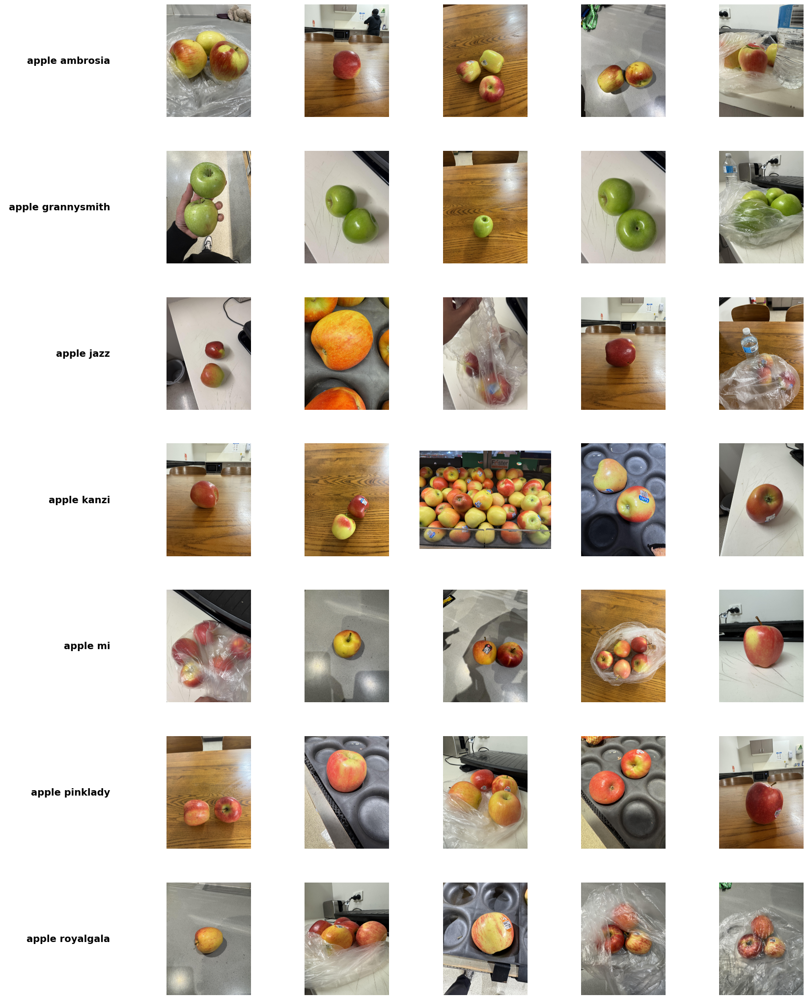

In [10]:
classes = sorted([
    d for d in os.listdir(data_dir)
    if os.path.isdir(os.path.join(data_dir, d))
])

n_classes = len(classes)

# for class name
fig, axes = plt.subplots(n_classes, 6, figsize=(18, 3 * n_classes))

for i, class_name in enumerate(classes):
    class_path = os.path.join(data_dir, class_name)

    images = [
        f for f in os.listdir(class_path)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    selected_images = random.sample(images, 5)

    # Class name
    axes[i, 0].axis("off")
    axes[i, 0].text(
        0.8, 0.5,
        class_name.replace("_", " "),
        fontsize=14,
        fontweight="bold",
        ha="right",
        va="center"
    )

    # Images
    for j in range(5):
        img_path = os.path.join(class_path, selected_images[j])
        img = Image.open(img_path)

        axes[i, j + 1].imshow(img)
        axes[i, j + 1].axis("off")


plt.subplots_adjust(
    left=0.05,
    right=0.98,
    top=0.98,
    bottom=0.02,
    wspace=0.05,
    hspace=0.3
)

plt.show()

## 2. EfficientNet

In [ ]:
CHECKPOINT_DIR = os.path.join(PROJECT_DIR, "checkpoints_efficientnet_iel")
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [11]:
# 60% TRAIN, 10% VAL, 30% TEST
base_dataset = datasets.ImageFolder(root=data_dir, transform=None)
class_names  = base_dataset.classes
num_classes  = len(class_names)
labels       = np.array([label for _, label in base_dataset.samples])
indices      = np.arange(len(base_dataset))

trainval_idx, test_idx = train_test_split(
    indices, test_size=0.30, stratify=labels, random_state=SEED
)
train_idx, val_idx = train_test_split(
    trainval_idx, test_size=10/70, stratify=labels[trainval_idx], random_state=SEED
)
print("Classes:", class_names)
print(f"Train: {len(train_idx)} | Val: {len(val_idx)} | Test: {len(test_idx)}")

Classes: ['apple_ambrosia', 'apple_grannysmith', 'apple_jazz', 'apple_kanzi', 'apple_mi', 'apple_pinklady', 'apple_royalgala']
Train: 313 | Val: 53 | Test: 157


In [12]:
# Transforms
IMG_SIZE = 300
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

train_plain_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

To improve training quality, slight augmentation is applied to the training set.
- Resize to 300x300 to meet the model input eligibility.
- Random horizontal flip and random rotation is applied to help models see other variations

Since fine-grained classification, from my perspective, is sensitive to colors and patterns. As a result, any color augmentations, cutout, mixup is not suitable in this task as it alters the color of fruits, and affects fruits' shapes.


In [13]:
class PlainSubset(Dataset):
    def __init__(self, dataset, indices, transform):
        self.dataset   = dataset
        self.indices   = list(indices)
        self.transform = transform

    def __len__(self): return len(self.indices)

    def __getitem__(self, i):
        img, label = self.dataset[self.indices[i]]
        return self.transform(img), label

The `PlainSubset` class is a custom PyTorch Dataset that enables the use of a selected subset of an existing dataset with a specified transformation. It takes the original dataset, a list of indices, and a transform function, allowing controlled access to specific samples without modifying the original data.

The `__getitem__` method retrieves each image–label pair using the provided indices and applies the transformation to the image before returning it. This approach supports flexible data splitting and dynamic sample selection, where different subsets can be used across sessions without permanently altering the dataset.

In [14]:
class GradCAMAugDataset(Dataset):
    def __init__(self, dataset, indices, heatmap_cache, transform):
        self.dataset       = dataset
        self.indices       = list(indices)
        self.heatmap_cache = heatmap_cache
        self.transform     = transform

    def __len__(self): return len(self.indices)

    def __getitem__(self, i):
        global_idx     = self.indices[i]
        img_pil, label = self.dataset[global_idx]
        img_np = np.array(img_pil.resize((IMG_SIZE, IMG_SIZE)).convert("RGB")).astype(np.uint8)
        record = self.heatmap_cache.get(global_idx)
        if record is not None and record["valid"]:
            img_np = apply_targeted_augmentations(
                img_np,
                record["constrained_heatmap"],
                record["foreground_mask"]
            )
        return self.transform(Image.fromarray(img_np.astype(np.uint8))), label

The `GradCAMAugDataset` class extends standard data loading by incorporating Grad-CAM–guided augmentations. It operates on a subset of the original dataset using specified indices and applies transformations dynamically during data retrieval.

For each sample, the class retrieves the corresponding image and label, resizes the image, and checks whether a valid Grad-CAM record exists in the heatmap_cache. If available, targeted augmentations are applied to regions highlighted by the heatmap, focusing on the most informative areas of the image while preserving foreground structure.

The processed image is then converted back to a PIL format and passed through the specified transformation pipeline before being returned. This approach enhances training by guiding augmentation toward discriminative regions, improving feature learning in fine-grained classification tasks without permanently altering the dataset.

In [15]:
BATCH_SIZE         = 16
NUM_WORKERS        = 0
MODEL_NAME         = "efficientnet_b3"
DROP_RATE          = 0.5
LABEL_EPS          = 0.1
ES_PATIENCE        = 7
# IEL settings
TAP_BLOCKS         = [ -1]  # backbone blocks to tap (+ conv_head always)
FUSION_DIM         = 512           # cross-layer fusion dimension
LAMBDA_ASSIST      = 0.5           # weight: final loss vs prior loss
# Foreground filtering
MIN_CAM_FG_OVERLAP   = 0.35
MIN_FG_AREA_RATIO    = 0.03
MAX_FG_AREA_RATIO    = 0.90
HEATMAP_THRESH_RATIO = 0.50
SKIP_BAD_HEATMAPS    = True
BG_BLUR_KERNEL       = 65
background_suppresion_threshold = 0.5


In [16]:
# Foreground Mask and Heatmap Validation
def estimate_fruit_foreground_mask(img_np):
    img_np = img_np.astype(np.uint8)
    H, W, _ = img_np.shape
    grabcut_mask = np.zeros((H, W), np.uint8)
    rect_margin  = int(0.05 * min(H, W))
    rect = (rect_margin, rect_margin, W - 2*rect_margin, H - 2*rect_margin)
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    try:
        cv2.grabCut(img_np, grabcut_mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)
        grabcut_fg = np.where(
            (grabcut_mask == cv2.GC_FGD) | (grabcut_mask == cv2.GC_PR_FGD), 1, 0
        ).astype(np.uint8)
    except Exception:
        grabcut_fg = np.ones((H, W), dtype=np.uint8)
    hsv = cv2.cvtColor(img_np, cv2.COLOR_RGB2HSV)
    H_hsv, S, V   = cv2.split(hsv)
    colour_mask    = ((S > 25) & (V > 45)).astype(np.uint8)
    red_mask       = ((H_hsv < 15) | (H_hsv > 165)).astype(np.uint8)
    gy_mask        = ((H_hsv >= 15) & (H_hsv <= 95)).astype(np.uint8)
    fruit_colour   = colour_mask & (red_mask | gy_mask)
    combined       = grabcut_fg & fruit_colour
    if combined.mean() < MIN_FG_AREA_RATIO:
        combined = grabcut_fg
    kernel   = np.ones((7, 7), np.uint8)
    combined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel)
    combined = cv2.morphologyEx(combined, cv2.MORPH_OPEN,  kernel)
    n_labels, labels_cc, stats, _ = cv2.connectedComponentsWithStats(
        combined.astype(np.uint8), connectivity=8
    )
    cleaned = np.zeros_like(combined, dtype=np.uint8)
    min_area = int(0.01 * H * W)
    for cid in range(1, n_labels):
        if stats[cid, cv2.CC_STAT_AREA] >= min_area:
            cleaned[labels_cc == cid] = 1
    if cleaned.mean() < MIN_FG_AREA_RATIO:
        cleaned = combined
    return cleaned.astype(np.float32)

def constrain_heatmap_to_foreground(raw_heatmap, foreground_mask):
    constrained = raw_heatmap.astype(np.float32) * foreground_mask.astype(np.float32)
    if constrained.max() > 0:
        constrained = (constrained - constrained.min()) / (constrained.max() - constrained.min() + 1e-8)
    return constrained.astype(np.float32)

def compute_cam_foreground_overlap(heatmap, foreground_mask):
    if heatmap.max() <= 0:
        return 0.0
    high_cam = heatmap >= (HEATMAP_THRESH_RATIO * heatmap.max())
    if high_cam.sum() == 0:
        return 0.0
    return float(foreground_mask[high_cam].mean())

def is_valid_heatmap(raw_heatmap, foreground_mask):
    fg_area  = float(foreground_mask.mean())
    overlap  = compute_cam_foreground_overlap(raw_heatmap, foreground_mask)
    valid    = (MIN_FG_AREA_RATIO <= fg_area <= MAX_FG_AREA_RATIO
                and overlap >= MIN_CAM_FG_OVERLAP)
    return valid, overlap, fg_area

This section estimates the fruit region in each image and ensures that Grad-CAM augmentations focus on meaningful foreground areas rather than the background.

The `estimate_fruit_foreground_mask()` function creates a foreground mask using two strategies. First, GrabCut is applied to separate the main object from the background. Then, HSV colour filtering is used to identify fruit-like colours, such as red, green, and yellow regions. These masks are combined to produce a more reliable fruit foreground area. Morphological operations and connected component filtering are then applied to clean small noise and retain meaningful object regions.

The `constrain_heatmap_to_foreground()` function multiplies the Grad-CAM heatmap by the foreground mask, ensuring that only fruit-related regions remain active. This prevents the augmentation process from focusing on irrelevant background areas.

The remaining functions evaluate whether the heatmap is reliable. They measure how much of the high-response Grad-CAM region overlaps with the estimated fruit foreground. A heatmap is considered valid only when the foreground size is reasonable and the Grad-CAM activation sufficiently overlaps with the fruit region. This helps avoid applying targeted augmentation to poor or misleading heatmaps.

In [17]:
# Augmentation
aug_prob = 0.5
alpha    = 0.10
beta     = 0.20

# TARGETED AUGMENTATIONS
def _peak_rect(heatmap, foreground_mask, alpha= alpha, beta=beta):
    """
    This function finds the spot the model cares about most on the fruit, draw a small random-sized box around it, return the box coordinates.
    """
    H, W       = heatmap.shape
    valid_map  = heatmap * foreground_mask # Multiplies heatmap by foreground mask — zeroes out any activation outside the fruit region, so background hotspots are ignored.
    if valid_map.max() <= 0:
        return None
    cy, cx = np.unravel_index(valid_map.argmax(), valid_map.shape) # Finds the single pixel with the highest activation value — the most discriminative point on the fruit. cy, cx is its row and column coordinate.
    h  = max(int(random.uniform(alpha, beta) * H), 1)
    w  = max(int(random.uniform(alpha, beta) * W), 1)
    r1 = max(cy - h//2, 0);  c1 = max(cx - w//2, 0)
    r2 = min(r1 + h, H);      c2 = min(c1 + w, W)
    return r1, c1, r2, c2

def local_area_crop_enlarge(img_np, heatmap, foreground_mask):
    """
    Crop the peak region then resize to full image size:
    removes all context, forces model to classify from peak region only.
    """
    rect = _peak_rect(heatmap, foreground_mask)
    if rect is None:
        return img_np
    r1, c1, r2, c2 = rect
    patch = img_np[r1:r2, c1:c2]
    if patch.size == 0:
        return img_np
    # Resize cropped patch to full image size
    enlarged = cv2.resize(patch, (img_np.shape[1], img_np.shape[0]),
                          interpolation=cv2.INTER_LINEAR)
    return enlarged


def background_suppression(img_np, heatmap, threshold=background_suppresion_threshold):
    # threshold controls how much of the image gets blurred, BG_BLUR_KERNEL controls how strongly those regions get blurred.
    if heatmap.max() <= 0:
        return img_np  # Safety check: if Grad-CAM is empty, do not blur the whole image.
    bg_mask = heatmap < (threshold * heatmap.max())
    blurred = cv2.GaussianBlur(img_np, (BG_BLUR_KERNEL, BG_BLUR_KERNEL), 0)
    out     = img_np.copy()
    out[bg_mask] = blurred[bg_mask]
    return out

def apply_targeted_augmentations(img_np, heatmap, foreground_mask):
    """
    random.random.random() generates a random float between 0.0 and 1.0 each time it's called.
    A single image gets a certain probability of being augmented.
    """
    if random.random() < aug_prob:
      img_np = local_area_crop_enlarge(img_np, heatmap, foreground_mask)
    return img_np

This section applies Grad-CAM-guided augmentation to the most informative fruit region. The parameters aug_prob, alpha, and beta control how often augmentation is applied and how large the selected local region will be.

The `_peak_rect()` function identifies the highest-response area in the Grad-CAM heatmap after restricting it to the fruit foreground. It then creates a small bounding box around this peak activation point, with the box size randomly selected between alpha and beta of the image dimensions.

The `local_area_crop_enlarge()` function crops this selected high-activation region and resizes it to the full image size. This forces the model to learn from the most discriminative local fruit features, such as colour patterns, texture, or surface details.

The `background_suppression()` function can blur low-activation regions so that the model focuses less on irrelevant background information. Finally, `apply_targeted_augmentations()` applies the local crop enlargement randomly based on aug_prob, ensuring that only some training images are augmented while the rest remain unchanged.

In [18]:
# LOSSES
class LabelSmoothingCE(nn.Module):
    def __init__(self, eps=0.1, num_classes=None):
        super().__init__()
        self.eps = eps; self.num_classes = num_classes

    def forward(self, logits, targets):
        K         = logits.size(1) if self.num_classes is None else self.num_classes
        log_probs = F.log_softmax(logits, dim=1)
        smooth    = self.eps / (K - 1)
        true_dist = torch.full_like(log_probs, smooth)
        true_dist.scatter_(1, targets.unsqueeze(1), 1.0 - self.eps)
        return -(true_dist * log_probs).sum(dim=1).mean()

def compute_iel_loss(final_logits, prior_logits, targets, criterion, lam=LAMBDA_ASSIST):
    """
    IEL dual loss:  final head loss + prior head (assist logits) loss.
    Analogous to IELT's combined cross-entropy over refined and
    cross-layer features.
    """
    return lam * criterion(final_logits, targets) + (1.0 - lam) * criterion(prior_logits, targets)


This section defines the training loss used to improve model generalisation and support the IEL-style architecture.

`LabelSmoothingCE` is a modified cross-entropy loss that prevents the model from becoming overconfident. Instead of assigning full probability to the correct class, it gives most of the probability to the true label and distributes a small amount across the other classes. This is useful for fine-grained classification because visually similar classes may share subtle features.

`compute_iel_loss()` combines two losses: one from the final output head and one from the prior or auxiliary head. The parameter lam controls the balance between them. This encourages the model to learn both refined final features and intermediate supportive features, improving robustness during training.

In [19]:
# 7. EFFICIENTNET-IEL MODEL
class EfficientNetIEL(nn.Module):
    def __init__(self, model_name, num_classes,
                 tap_blocks=TAP_BLOCKS, fusion_dim=FUSION_DIM, drop_rate=DROP_RATE):
        super().__init__()

        # Backbone: raw feature maps, no global pool, no head
        self.backbone = timm.create_model(
            model_name, pretrained=True, num_classes=0,
            global_pool='', drop_rate=drop_rate
        )

        # Resolve negative block indices
        self.tap_blocks = [i if i >= 0 else len(self.backbone.blocks) + i
                           for i in tap_blocks]
        self.fusion_dim  = fusion_dim
        self.num_classes = num_classes

        # Permanent hooks to capture intermediate feature maps
        self._features = {}
        self._hooks     = []
        self._register_tap_hooks()

        # Detect channel dims via dummy forward (backbone on CPU)
        channel_dims = self._detect_channel_dims()          # tapped blocks
        channel_dims.append(self.backbone.num_features)     # + conv_head

        # Projectors: spatial feature -> fusion_dim vector (CLR analog)
        self.projectors = nn.ModuleList([
            nn.Sequential(
                nn.AdaptiveAvgPool2d(1),
                nn.Flatten(),
                nn.Linear(c, fusion_dim),
                nn.LayerNorm(fusion_dim),
                nn.GELU(),
                nn.Dropout(drop_rate)
            )
            for c in channel_dims
        ])

        n_layers = len(channel_dims)

        # Cross-Layer Self-Attention
        self.cross_layer_attn = nn.MultiheadAttention(
            embed_dim=fusion_dim, num_heads=8,
            dropout=drop_rate, batch_first=True
        )
        self.ln1 = nn.LayerNorm(fusion_dim)
        self.ln2 = nn.LayerNorm(fusion_dim)
        self.ffn = nn.Sequential(
            nn.Linear(fusion_dim, fusion_dim * 2),
            nn.GELU(),
            nn.Dropout(drop_rate),
            nn.Linear(fusion_dim * 2, fusion_dim),
            nn.Dropout(drop_rate)
        )

        # Prior head: cross-layer mean -> assist logits
        self.prior_head = nn.Sequential(
            nn.Dropout(drop_rate),
            nn.Linear(fusion_dim, num_classes)
        )

        # Final head: refined feature -> prediction
        self.final_head = nn.Sequential(
            nn.Dropout(drop_rate),
            nn.Linear(fusion_dim, num_classes)
        )

    def _register_tap_hooks(self):
        for idx in self.tap_blocks:
            def make_hook(i):
                def hook(module, input, output):
                    self._features[i] = output
                return hook
            h = self.backbone.blocks[idx].register_forward_hook(make_hook(idx))
            self._hooks.append(h)

    def _detect_channel_dims(self):
        self.backbone.eval()
        with torch.no_grad():
            dummy = torch.zeros(1, 3, IMG_SIZE, IMG_SIZE)
            _     = self.backbone(dummy)
        dims = [self._features[i].shape[1] for i in self.tap_blocks]
        self._features.clear()
        return dims

    def forward(self, x):
        self._features.clear()

        # Full backbone forward; hooks populate self._features
        final_feat = self.backbone(x)               # (B, C_final, H', W')

        # Collect tapped + final features
        layer_feats = [self._features[i] for i in self.tap_blocks] + [final_feat]

        # Project each to fusion_dim → (B, fusion_dim) per layer
        projected = [proj(feat) for proj, feat in zip(self.projectors, layer_feats)]

        # Stack as sequence: (B, n_layers, fusion_dim)
        seq = torch.stack(projected, dim=1)

        # Prior prediction from cross-layer mean (assist logits)
        cross_layer_feat = seq.mean(dim=1)           # (B, fusion_dim)
        prior_logits     = self.prior_head(cross_layer_feat)

        # Cross-Layer Refinement via self-attention
        attn_out, _ = self.cross_layer_attn(seq, seq, seq)
        seq         = self.ln1(seq + attn_out)
        seq         = self.ln2(seq + self.ffn(seq))

        # Refined feature: mean of attended sequence
        refined_feat  = seq.mean(dim=1)              # (B, fusion_dim)

        # ── Final prediction: refined + prior residual (assist logits) ──
        final_logits = self.final_head(refined_feat) + LAMBDA_ASSIST * prior_logits

        return final_logits, prior_logits

The EfficientNetIEL class defines a modified EfficientNet model inspired by Internal Ensemble Learning. Instead of relying only on the final EfficientNet feature map, it extracts features from multiple intermediate backbone blocks and combines them to improve fine-grained classification.

The model first loads a pretrained EfficientNet backbone without its original classification head. Forward hooks are registered on selected EfficientNet blocks so that intermediate feature maps can be captured during the forward pass. These tapped features, together with the final backbone feature map, represent information from different semantic levels of the image.

Each feature map is passed through a projection module that converts it into a fixed-size feature vector. These projected vectors are then stacked as a sequence and refined using multi-head self-attention. This allows the model to learn relationships between features from different EfficientNet layers, similar to cross-layer refinement in IELT.

The model produces two outputs: prior_logits and final_logits. The prior head provides an auxiliary prediction from the average cross-layer feature, while the final head makes the main prediction after attention-based feature refinement. The final logits also include a residual contribution from the prior logits, encouraging the model to use both intermediate and refined representations. This design helps the model capture subtle visual differences between similar fruit classes.

In [20]:
# Layer Freeze / Unfreeze
def freeze_backbone(model):
    """Freeze entire backbone; keep IEL head trainable."""
    for param in model.backbone.parameters():
        param.requires_grad = False
    for param in model.projectors.parameters():
        param.requires_grad = True
    for param in model.cross_layer_attn.parameters():
        param.requires_grad = True
    for param in model.ln1.parameters():
        param.requires_grad = True
    for param in model.ln2.parameters():
        param.requires_grad = True
    for param in model.ffn.parameters():
        param.requires_grad = True
    for param in model.prior_head.parameters():
        param.requires_grad = True
    for param in model.final_head.parameters():
        param.requires_grad = True
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total     = sum(p.numel() for p in model.parameters())
    print(f"Frozen backbone. Trainable: {trainable:,} / {total:,}")

def unfreeze_top_blocks(model, num_blocks):
    """Unfreeze the top N backbone blocks + conv_head + bn2."""
    for block in model.backbone.blocks[-num_blocks:]:
        for param in block.parameters():
            param.requires_grad = True
    for attr in ["conv_head", "bn2"]:
        if hasattr(model.backbone, attr):
            for param in getattr(model.backbone, attr).parameters():
                param.requires_grad = True
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total     = sum(p.numel() for p in model.parameters())
    print(f"Unfroze top {num_blocks} blocks. Trainable: {trainable:,} / {total:,}")

In [21]:
MODEL_NAME = "efficientnet_b3"
def build_model(num_classes):
    model = EfficientNetIEL(MODEL_NAME, num_classes)
    return model.to(DEVICE)

In [22]:
# early stopping
class EarlyStopping:
    def __init__(self, patience=ES_PATIENCE, min_delta=1e-4):
        self.patience   = patience
        self.min_delta  = min_delta
        self.counter    = 0
        self.best_loss  = float('inf')
        self.stop       = False

    def step(self, val_loss):
        if val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter   = 0
        else:
            self.counter += 1
            print(f"EarlyStopping counter: {self.counter}/{self.patience}")
            if self.counter >= self.patience:
                self.stop = True


In [23]:
# MULTI-LAYER GRAD-CAM  (Multi-Layer Voting analog of MHV)
class MultiLayerGradCAM:
    """
    Registers Grad-CAM hooks on multiple backbone layers.
    Each layer acts as a weak learner (MLV analog of MHV).
    Layer weights are computed dynamically from foreground
    overlap scores (DS analog).
    """
    def __init__(self, model, target_layers):
        self.model         = model
        self.target_layers = target_layers
        self.activations   = {i: None for i in range(len(target_layers))}
        self.gradients     = {i: None for i in range(len(target_layers))}
        self._hooks        = []

        for i, layer in enumerate(target_layers):
            def make_fwd(idx):
                def hook(module, input, output):
                    self.activations[idx] = output
                return hook
            def make_bwd(idx):
                def hook(module, grad_input, grad_output):
                    self.gradients[idx] = grad_output[0]
                return hook
            self._hooks.append(layer.register_forward_hook(make_fwd(i)))
            self._hooks.append(layer.register_full_backward_hook(make_bwd(i)))

    def remove_hooks(self):
        for h in self._hooks:
            h.remove()

    def _single_cam(self, act, grad):
        """Compute one Grad-CAM from activations + gradients."""
        weights  = grad.mean(dim=(1, 2), keepdim=True)
        cam      = F.relu((weights * act).sum(dim=0))
        cam      = cam.detach().cpu().numpy()
        cam      = cv2.resize(cam, (IMG_SIZE, IMG_SIZE))
        if cam.max() > cam.min():
            cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        else:
            cam = np.zeros_like(cam)
        return cam.astype(np.float32)

    def generate_voted(self, img_tensor, foreground_mask=None, target_cls=None):
        """
        Forward + backward through all tapped layers.
        Each layer's Grad-CAM acts as a weak learner.
        Dynamic weights (DS analog) are derived from foreground overlap.
        Returns: voted_heatmap, per_layer_heatmaps, layer_weights
        """
        self.model.eval()
        img = img_tensor.unsqueeze(0).to(DEVICE)

        final_logits, _ = self.model(img)
        if target_cls is None:
            target_cls = final_logits.argmax(dim=1).item()

        self.model.zero_grad()
        final_logits[0, target_cls].backward()

        # Collect per-layer Grad-CAM heatmaps
        per_layer = []
        for i in range(len(self.target_layers)):
            if self.activations[i] is not None and self.gradients[i] is not None:
                cam = self._single_cam(self.activations[i][0], self.gradients[i][0])
                per_layer.append(cam)

        if len(per_layer) == 0:
            dummy = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.float32)
            return dummy, [], np.array([])

        # Dynamic weighting based on foreground overlap (DS analog)
        if foreground_mask is not None:
            weights = np.array([
                compute_cam_foreground_overlap(h, foreground_mask)
                for h in per_layer
            ], dtype=np.float32)
            total = weights.sum()
            weights = weights / (total + 1e-8) if total > 0 else np.ones(len(per_layer)) / len(per_layer)
        else:
            weights = np.ones(len(per_layer), dtype=np.float32) / len(per_layer)

        # Weighted vote across all layers (MLV)
        voted = sum(w * h for w, h in zip(weights, per_layer))
        if voted.max() > voted.min():
            voted = (voted - voted.min()) / (voted.max() - voted.min() + 1e-8)

        return voted.astype(np.float32), per_layer, weights

def get_gradcam_layers(model):
    """Tapped backbone blocks + conv_head as Grad-CAM targets."""
    layers = [model.backbone.blocks[i] for i in model.tap_blocks]
    layers.append(model.backbone.conv_head)
    return layers

The MultiLayerGradCAM class generates Grad-CAM heatmaps from multiple EfficientNet layers instead of using only one final layer. Each selected layer acts like a weak visual learner by highlighting different discriminative regions of the fruit.

Forward and backward hooks are registered on the target layers to capture activations and gradients during prediction. The `_single_cam()` function then combines these activations and gradients to produce one Grad-CAM heatmap for each layer.

The `generate_voted()` function produces heatmaps from all selected layers and combines them into one final voted heatmap. If a foreground mask is available, each layer is weighted based on how well its Grad-CAM overlaps with the fruit region. Layers that focus more on the fruit receive higher importance, while layers focusing on the background contribute less.

Overall, this multi-layer voting approach creates a more reliable heatmap for targeted augmentation by combining information from different levels of the EfficientNet backbone.

In [24]:
# traun / eval
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for imgs, targets in loader:
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        optimizer.zero_grad()
        final_logits, prior_logits = model(imgs)
        loss = compute_iel_loss(final_logits, prior_logits, targets, criterion)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
        correct    += final_logits.argmax(dim=1).eq(targets).sum().item()
        total      += imgs.size(0)
    return total_loss / total, correct / total

@torch.no_grad()
def evaluate(model, loader, criterion):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    for imgs, targets in loader:
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        final_logits, _ = model(imgs)
        loss       = criterion(final_logits, targets)
        total_loss += loss.item() * imgs.size(0)
        correct    += final_logits.argmax(dim=1).eq(targets).sum().item()
        total      += imgs.size(0)
    return total_loss / total, correct / total

In [25]:
# GRAD-CAM CACHE BUILDER
def build_gradcam_cache(model, base_dataset, indices):
    gradcam = MultiLayerGradCAM(model, get_gradcam_layers(model))
    cache   = {}
    records = []
    valid_count = skipped_count = 0

    for i, global_idx in enumerate(indices):
        img_pil, label = base_dataset[global_idx]
        img_np = np.array(img_pil.resize((IMG_SIZE, IMG_SIZE)).convert("RGB")).astype(np.uint8)

        # Estimate fruit foreground
        foreground_mask = estimate_fruit_foreground_mask(img_np)

        # Multi-layer Grad-CAM with dynamic weighting (DS analog)
        voted_heatmap, per_layer_heatmaps, layer_weights = gradcam.generate_voted(
            val_transform(img_pil),
            foreground_mask=foreground_mask,
            target_cls=int(label)
        )

        # Constrain to foreground
        constrained = constrain_heatmap_to_foreground(voted_heatmap, foreground_mask)

        # Validate
        valid, overlap, fg_area = is_valid_heatmap(voted_heatmap, foreground_mask)
        if SKIP_BAD_HEATMAPS and not valid:
            final_valid = False; skipped_count += 1
        else:
            final_valid = True;  valid_count   += 1

        cache[global_idx] = {
            "raw_heatmap":         voted_heatmap,
            "per_layer_heatmaps":  per_layer_heatmaps,
            "layer_weights":       layer_weights,
            "foreground_mask":     foreground_mask,
            "constrained_heatmap": constrained,
            "valid":               final_valid,
            "overlap":             overlap,
            "foreground_area":     fg_area,
            "label":               int(label),
            "class_name":          class_names[int(label)]
        }
        records.append({
            "global_idx":           int(global_idx),
            "class_name":           class_names[int(label)],
            "valid":                final_valid,
            "cam_fg_overlap":       overlap,
            "fg_area_ratio":        fg_area,
            "layer_weights":        list(layer_weights) if len(layer_weights) > 0 else []
        })

    gradcam.remove_hooks()

    report_df   = pd.DataFrame(records)
    report_path = os.path.join(CHECKPOINT_DIR, "gradcam_quality_report.csv")
    report_df.to_csv(report_path, index=False)
    return cache

The `build_gradcam_cache()` function precomputes Grad-CAM information for selected training images and stores it in a cache for later augmentation.
For each image, the function first estimates the fruit foreground mask, then generates a multi-layer Grad-CAM heatmap using the true class label as the target. The heatmap is constrained to the foreground region so that attention is focused on the fruit rather than the background.

The function then checks whether the heatmap is valid by measuring foreground size and Grad-CAM overlap with the fruit area. Valid heatmaps are stored and used later for targeted augmentation, while poor-quality heatmaps can be skipped depending on the `SKIP_BAD_HEATMAPS` setting.

Each cache entry stores the raw heatmap, constrained heatmap, foreground mask, layer weights, validity status, overlap score, and class label.


In [26]:
def overlay_heatmap(img_np, heatmap):
    heatmap_colour = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_colour = cv2.cvtColor(heatmap_colour, cv2.COLOR_BGR2RGB)
    return cv2.addWeighted(img_np, 0.55, heatmap_colour, 0.45, 0)

def visualize_gradcam_samples(base_dataset, heatmap_cache, sample_indices, save_name):
    """
    For each sample show:
    Original | Per-layer Grad-CAMs| Voted Grad-CAM | Foreground mask
    """
    n_layers  = len(get_gradcam_layers(model))   # tap blocks + conv_head
    n_cols    = 2 + n_layers + 1                 # orig + layers + voted + fg
    n         = len(sample_indices)
    fig, axes = plt.subplots(n, n_cols, figsize=(3 * n_cols, 3.5 * n))
    if n == 1:
        axes = np.expand_dims(axes, axis=0)

    layer_labels = [f"Block {model.tap_blocks[i]}" for i in range(n_layers - 1)] + ["conv_head"]

    fig.suptitle("Original | Per-Layer Grad-CAM (MLV) | Voted | Foreground",
                 fontsize=14, y=1.01)

    for row, global_idx in enumerate(sample_indices):
        img_pil, label = base_dataset[global_idx]
        img_np = np.array(img_pil.resize((IMG_SIZE, IMG_SIZE)).convert("RGB")).astype(np.uint8)
        record = heatmap_cache[global_idx]

        col = 0
        axes[row, col].imshow(img_np)
        axes[row, col].set_title(f"Original\n{class_names[label]}", fontsize=8)
        axes[row, col].axis("off")
        col += 1

        # Per-layer heatmaps with their dynamic weights
        for li, (lh, lw) in enumerate(zip(record["per_layer_heatmaps"], record["layer_weights"])):
            axes[row, col].imshow(overlay_heatmap(img_np, lh))
            axes[row, col].set_title(f"{layer_labels[li]}\nw={lw:.2f}", fontsize=8)
            axes[row, col].axis("off")
            col += 1

        # Voted (weighted ensemble) heatmap
        axes[row, col].imshow(overlay_heatmap(img_np, record["constrained_heatmap"]))
        axes[row, col].set_title(
            f"Voted+Constrained\noverlap={record['overlap']:.2f}", fontsize=8
        )
        axes[row, col].axis("off")
        col += 1

        # Foreground mask
        axes[row, col].imshow(record["foreground_mask"], cmap="gray")
        axes[row, col].set_title("Foreground mask", fontsize=8)
        axes[row, col].axis("off")

    plt.tight_layout()
    save_path = os.path.join(CHECKPOINT_DIR, save_name)
    plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()

def plot_history(history, title, save_prefix):
    epochs = range(1, len(history["train_loss"]) + 1)
    for metric, ylabel in [("loss", "Loss"), ("acc", "Accuracy")]:
        plt.figure(figsize=(8, 5))
        plt.plot(epochs, history[f"train_{metric}"], label=f"Train {ylabel}")
        plt.plot(epochs, history[f"val_{metric}"],   label=f"Val {ylabel}")
        plt.xlabel("Epoch"); plt.ylabel(ylabel)
        plt.title(f"{title} {ylabel}"); plt.legend(); plt.tight_layout()
        plt.savefig(os.path.join(CHECKPOINT_DIR, f"{save_prefix}_{metric}.png"), dpi=300)
        plt.show()

In [27]:
# Data loaders and weighted sampler
# Weighted sampler helps weaker / confused classes by balancing how often each class appears during training. Use sampler=True behaviour by setting shuffle=False in the training loaders.
train_labels = [base_dataset.samples[i][1] for i in train_idx]
class_counts = Counter(train_labels)
class_weights = {cls: 1.0 / count for cls, count in class_counts.items()}
sample_weights = [class_weights[label] for label in train_labels]

train_sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

print("Training class counts:", {class_names[k]: v for k, v in class_counts.items()})

train_loader_s1 = DataLoader(
    PlainSubset(base_dataset, train_idx, train_plain_transform),
    batch_size=BATCH_SIZE,
    sampler=train_sampler,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)
val_loader = DataLoader(
    PlainSubset(base_dataset, val_idx, val_transform),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    PlainSubset(base_dataset, test_idx, val_transform),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
criterion = LabelSmoothingCE(eps=LABEL_EPS, num_classes=num_classes)

Training class counts: {'apple_jazz': 40, 'apple_royalgala': 56, 'apple_pinklady': 46, 'apple_grannysmith': 39, 'apple_kanzi': 38, 'apple_mi': 55, 'apple_ambrosia': 39}


This section defines the data loading process and introduces a weighted sampling strategy to address class imbalance during training.

Class frequencies are first computed from the training data, and inverse class weights are assigned so that underrepresented classes receive higher importance. These weights are then used to create a `WeightedRandomSampler`, which ensures that samples from minority or confusing classes are drawn more frequently during training. As a result, the model is exposed to a more balanced distribution of classes without modifying the dataset itself.

The training data loader (train_loader_s1) uses this sampler instead of standard shuffling, enabling controlled sampling across batches. In contrast, the validation and test loaders use deterministic ordering without sampling to ensure consistent and unbiased evaluation.

Finally, the training criterion is defined using label smoothing cross-entropy, which helps reduce overconfidence and improves generalisation, particularly in fine-grained classification tasks.

### 2.1 Stage 1 Training

STAGE 1


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Frozen backbone. Trainable: 3,096,078 / 13,792,310
Unfroze top 3 blocks. Trainable: 12,989,916 / 13,792,310
[Stage 1 | Epoch 1/30] Train Loss: 1.9424 | Train Acc: 0.2364 | Val Loss: 1.6255 | Val Acc: 0.4340
Saved Stage 1 best checkpoint: val_loss=1.6255
[Stage 1 | Epoch 2/30] Train Loss: 1.5976 | Train Acc: 0.4760 | Val Loss: 1.2916 | Val Acc: 0.6038
Saved Stage 1 best checkpoint: val_loss=1.2916
[Stage 1 | Epoch 3/30] Train Loss: 1.2443 | Train Acc: 0.7316 | Val Loss: 1.1461 | Val Acc: 0.7170
Saved Stage 1 best checkpoint: val_loss=1.1461
[Stage 1 | Epoch 4/30] Train Loss: 1.0390 | Train Acc: 0.8083 | Val Loss: 0.9634 | Val Acc: 0.8679
Saved Stage 1 best checkpoint: val_loss=0.9634
[Stage 1 | Epoch 5/30] Train Loss: 0.8924 | Train Acc: 0.8786 | Val Loss: 0.9200 | Val Acc: 0.8302
Saved Stage 1 best checkpoint: val_loss=0.9200
[Stage 1 | Epoch 6/30] Train Loss: 0.7973 | Train Acc: 0.9137 | Val Loss: 0.9426 | Val Acc: 0.8302
EarlyStopping counter: 1/7
[Stage 1 | Epoch 7/30] Train Loss: 0

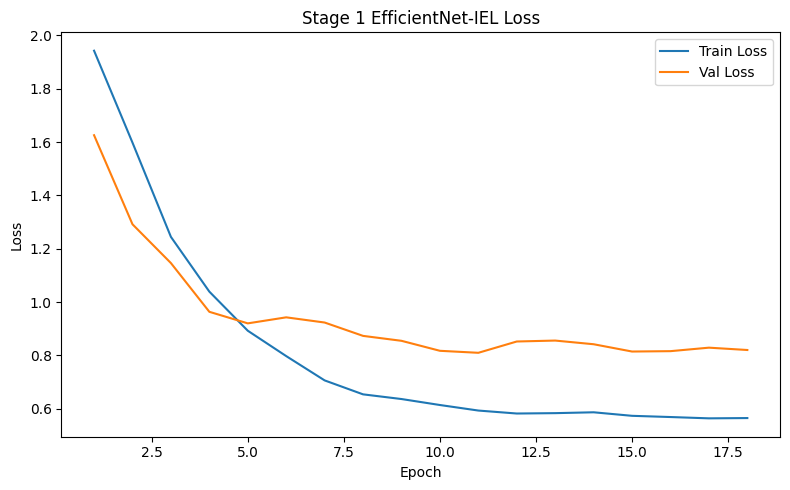

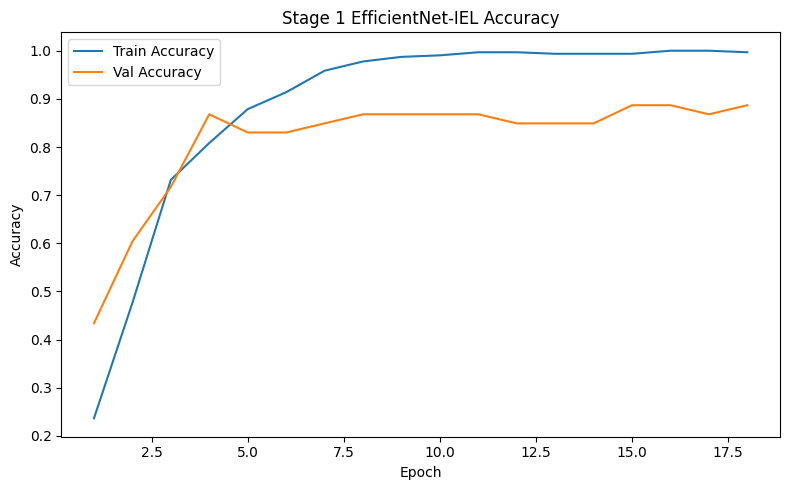

In [28]:
# STAGE 1:
stage1_no_epoch = 30
unfreeze_block_stage1 = 3
weight_decay_stage1 = 5e-3
lr_stage1 = 2e-4

print("STAGE 1")
print("=" * 60)
model = build_model(num_classes)
freeze_backbone(model)
unfreeze_top_blocks(model, num_blocks=unfreeze_block_stage1)
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=lr_stage1, weight_decay= weight_decay_stage1
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=stage1_no_epoch, eta_min=1e-6
)
early_stop      = EarlyStopping(patience=ES_PATIENCE)
best_val_loss   = float('inf')
stage1_history  = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

for epoch in range(1, stage1_no_epoch + 1):
    train_loss, train_acc = train_one_epoch(model, train_loader_s1, optimizer, criterion)
    val_loss,   val_acc   = evaluate(model, val_loader, criterion)
    scheduler.step()

    for k, v in zip(["train_loss","train_acc","val_loss","val_acc"],
                    [train_loss, train_acc, val_loss, val_acc]):
        stage1_history[k].append(v)

    print(f"[Stage 1 | Epoch {epoch}/{stage1_no_epoch}] "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "stage":           "stage1_best",
            "epoch":           epoch,
            "model_state_dict": model.state_dict(),
            "best_val_loss":   best_val_loss,
            "class_names":     class_names,
            "history":         stage1_history
        }, os.path.join(CHECKPOINT_DIR, "stage1_best_checkpoint.pt"))
        print(f"Saved Stage 1 best checkpoint: val_loss={val_loss:.4f}")

    early_stop.step(val_loss)
    if early_stop.stop:
        print(f"Early stopping Stage 1 at epoch {epoch}.")
        break

torch.save({
    "stage":           "stage1_final",
    "epoch":           epoch,
    "model_state_dict": model.state_dict(),
    "best_val_loss":   best_val_loss,
    "class_names":     class_names,
    "history":         stage1_history
}, os.path.join(CHECKPOINT_DIR, "stage1_final_checkpoint.pt"))
print("Saved Stage 1 final checkpoint.")
plot_history(stage1_history, "Stage 1 EfficientNet-IEL", "stage1")

Stage 1 aims to train an initial EfficientNet-IEL model on the original dataset to learn strong baseline feature representations and classification capability.
During this stage, the model learns to identify discriminative visual patterns across fruit classes without relying on Grad-CAM–guided augmentation. The trained model is then used to generate reliable multi-layer Grad-CAM heatmaps, which highlight important regions of the images.

These heatmaps serve as the foundation for Stage 2, where targeted augmentations are applied to improve the model’s ability to focus on fine-grained details. Thus, Stage 1 establishes both a strong baseline model and the necessary attention information for subsequent refinement.

Overall, training in stage 1 is good despite small overfitting, but it is still showing some signs of learning. The training reaches best validation loss at epoch 11 at 0.8096, before ending training at epochs 18 due to no improvement.

Visualising random training examples...


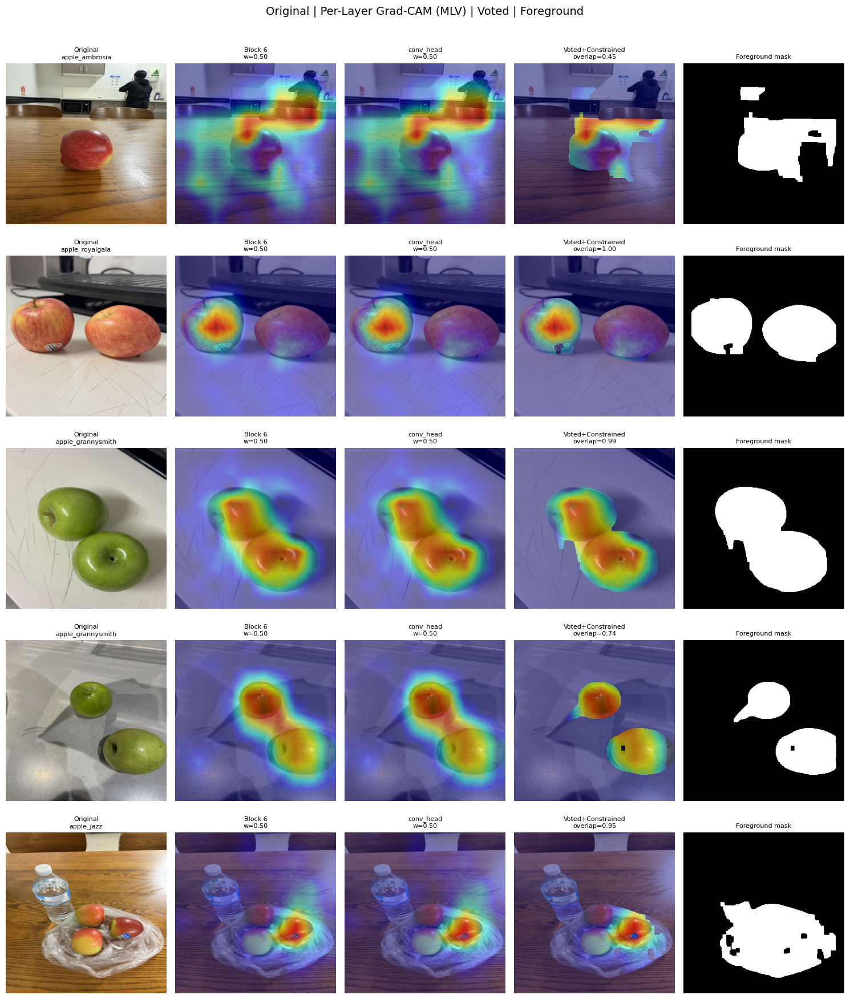

Visualising skipped background-focused examples...


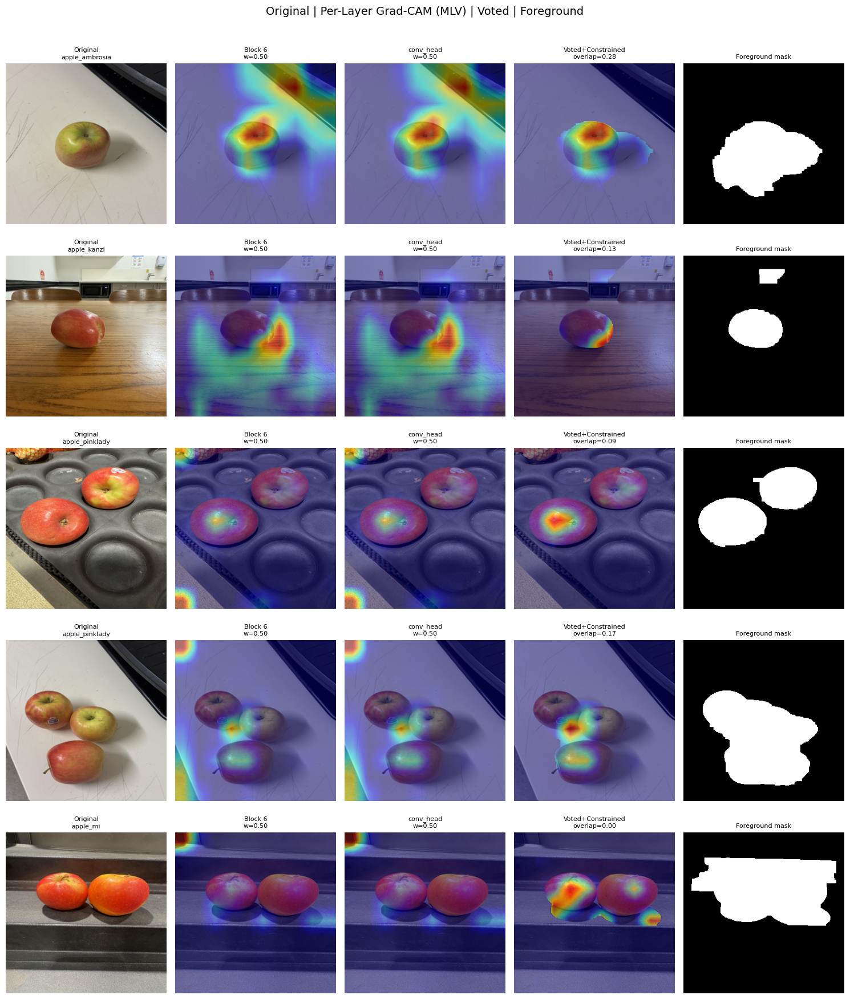

In [29]:
# GENERATE MULTI-LAYER GRAD-CAM HEATMAPS
stage1_ckpt = torch.load(
    os.path.join(CHECKPOINT_DIR, "stage1_best_checkpoint.pt"), map_location=DEVICE
)
model.load_state_dict(stage1_ckpt["model_state_dict"])

heatmap_cache = build_gradcam_cache(model, base_dataset, train_idx)
torch.save(heatmap_cache, os.path.join(CHECKPOINT_DIR, "iel_gradcam_cache.pt"))

# VISUALISE GRAD-CAM SAMPLES
print("Visualising random training examples...")
sample_indices = random.sample(list(train_idx), min(5, len(train_idx)))
visualize_gradcam_samples(base_dataset, heatmap_cache, sample_indices,
                          "iel_gradcam_samples.png")

bad_indices = [idx for idx in train_idx if not heatmap_cache[idx]["valid"]]
if len(bad_indices) > 0:
    print("Visualising skipped background-focused examples...")
    visualize_gradcam_samples(base_dataset, heatmap_cache,
                              random.sample(bad_indices, min(5, len(bad_indices))),
                              "iel_gradcam_skipped_samples.png")

Overall, the model targets into the fruits, which is a good sign for stage 2. However, the model is still distracted by backgrounds such as the table, person and surrounding objects.

Unblocking 1 block gives a better result than unblocking more blocks. Before, when I tested on unblocking 2 (Block 5 and 6) blocks and 3 blocks (Block 4,5,6), Block 4 and 5 generally focus on the surrounding backgrounds more seriously rather than targeting the apples solely.

I understand there is still room for improvement when we look at the current heatmap, but the heatmap is reliable enough for stage 2 training.

### 2.2 Stage 2 Training

STAGE 2
Unfroze top 4 blocks. Trainable: 13,628,616 / 13,792,310
[Stage 2 | Epoch 1/30] Train Loss: 1.7363 | Train Acc: 0.4377 | Val Loss: 1.8534 | Val Acc: 0.3208
Saved Stage 2 best checkpoint: val_loss=1.8534
[Stage 2 | Epoch 2/30] Train Loss: 1.5027 | Train Acc: 0.5112 | Val Loss: 1.8191 | Val Acc: 0.4151
Saved Stage 2 best checkpoint: val_loss=1.8191
[Stage 2 | Epoch 3/30] Train Loss: 1.4187 | Train Acc: 0.5655 | Val Loss: 1.9202 | Val Acc: 0.5472
EarlyStopping counter: 1/7
[Stage 2 | Epoch 4/30] Train Loss: 1.5108 | Train Acc: 0.5783 | Val Loss: 1.3921 | Val Acc: 0.5849
Saved Stage 2 best checkpoint: val_loss=1.3921
[Stage 2 | Epoch 5/30] Train Loss: 1.4432 | Train Acc: 0.5048 | Val Loss: 1.4323 | Val Acc: 0.5472
EarlyStopping counter: 1/7
[Stage 2 | Epoch 6/30] Train Loss: 1.4209 | Train Acc: 0.5655 | Val Loss: 1.5481 | Val Acc: 0.5472
EarlyStopping counter: 2/7
[Stage 2 | Epoch 7/30] Train Loss: 1.2979 | Train Acc: 0.6166 | Val Loss: 1.4878 | Val Acc: 0.6415
EarlyStopping counte

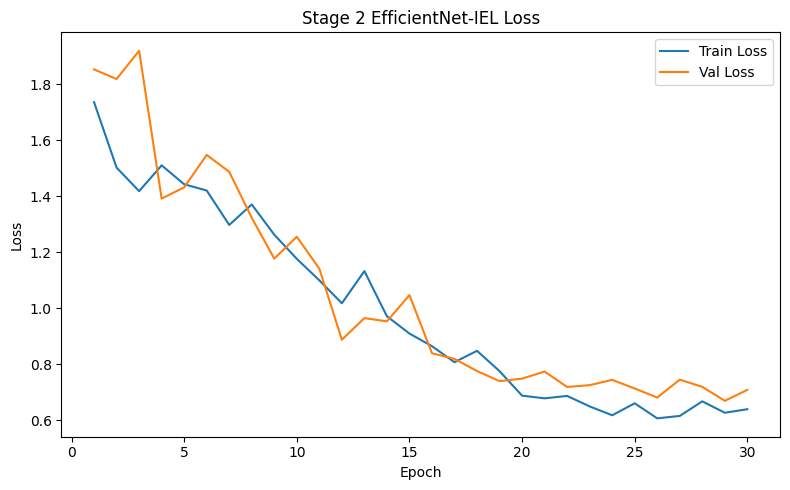

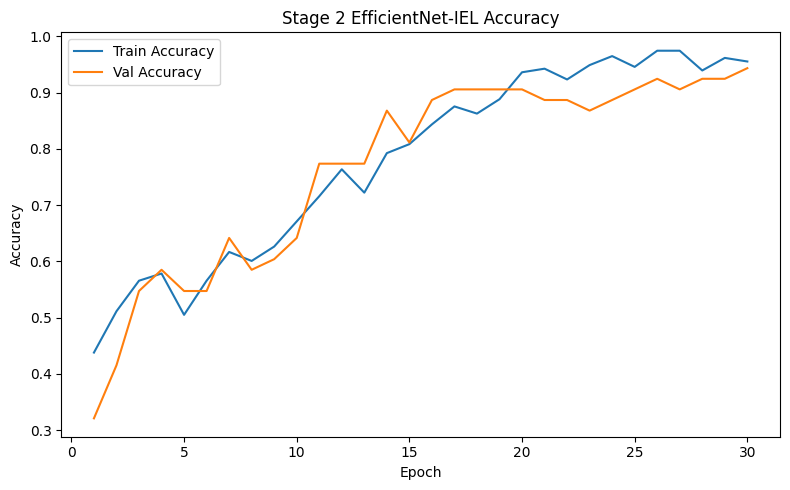

In [30]:
# STAGE 2:
stage2_no_epoch = 30
lr_stage2 = 2e-3
weight_decay_stage2 = 1e-4
unfreeze_blocks_stage2 = 4
print("STAGE 2")
print("=" * 60)
unfreeze_top_blocks(model, num_blocks=unfreeze_blocks_stage2)

train_loader_s2 = DataLoader(
    GradCAMAugDataset(base_dataset, train_idx, heatmap_cache, train_plain_transform),
    batch_size=BATCH_SIZE,
    sampler=train_sampler,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=lr_stage2, weight_decay=weight_decay_stage2
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=stage2_no_epoch, eta_min=1e-7
)
early_stop     = EarlyStopping(patience=ES_PATIENCE)
best_val_loss  = float('inf')
stage2_history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

for epoch in range(1, stage2_no_epoch + 1):
    train_loss, train_acc = train_one_epoch(model, train_loader_s2, optimizer, criterion)
    val_loss,   val_acc   = evaluate(model, val_loader, criterion)
    scheduler.step()

    for k, v in zip(["train_loss","train_acc","val_loss","val_acc"],
                    [train_loss, train_acc, val_loss, val_acc]):
        stage2_history[k].append(v)

    print(f"[Stage 2 | Epoch {epoch}/{stage2_no_epoch}] "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "stage":                "stage2_best",
            "epoch":                epoch,
            "model_state_dict":     model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "best_val_loss":        best_val_loss,
            "class_names":          class_names,
            "history":              stage2_history
        }, os.path.join(CHECKPOINT_DIR, "stage2_best_checkpoint.pt"))
        print(f"Saved Stage 2 best checkpoint: val_loss={val_loss:.4f}")

    early_stop.step(val_loss)
    if early_stop.stop:
        print(f"Early stopping Stage 2 at epoch {epoch}.")
        break

torch.save({
    "stage":                "stage2_final",
    "epoch":                epoch,
    "model_state_dict":     model.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "scheduler_state_dict": scheduler.state_dict(),
    "best_val_loss":        best_val_loss,
    "class_names":          class_names,
    "history":              stage2_history
}, os.path.join(CHECKPOINT_DIR, "stage2_final_checkpoint.pt"))
print("Saved Stage 2 final checkpoint.")
plot_history(stage2_history, "Stage 2 EfficientNet-IEL", "stage2")

Stage 2 initially shows a better performance compared to Stage 1, which implies that the generated heatmaps are helpful in later stage training.

Stage 2 validation accuracy reaches 0.6699,compared to around 0.80 in stage 1, and it also achieves better validation accuracy. Both validation loss/ train loss and validation accuracy/ train accuracy curves move together, which is very good (in stage 1 train loss go down and validation loss is stable).

There is no sign of overfitting in stage 2, indicating it is learning generalisable features rather than memorising training samples.

Because the model reaches the lowest validation loss point at epoch 29 while the set up is stopped after 30 epochs. As a result, there might be a chance that additional training improves the model.

15 additional epochs will be executed, starting from the best validation loss (epoch 29).


Resumed from epoch 29 | best_val_loss=0.6699
Unfroze top 4 blocks. Trainable: 13,628,616 / 13,792,310
[Resume | Epoch 1/15] Train Loss: 0.6269 | Train Acc: 0.9712 | Val Loss: 0.6888 | Val Acc: 0.9245
[Resume | Epoch 2/15] Train Loss: 0.6611 | Train Acc: 0.9521 | Val Loss: 0.7132 | Val Acc: 0.9245
EarlyStopping counter: 1/7
[Resume | Epoch 3/15] Train Loss: 0.5921 | Train Acc: 0.9904 | Val Loss: 0.6758 | Val Acc: 0.9245
[Resume | Epoch 4/15] Train Loss: 0.6141 | Train Acc: 0.9585 | Val Loss: 0.7026 | Val Acc: 0.9245
EarlyStopping counter: 1/7
[Resume | Epoch 5/15] Train Loss: 0.6234 | Train Acc: 0.9553 | Val Loss: 0.6746 | Val Acc: 0.9245
[Resume | Epoch 6/15] Train Loss: 0.6184 | Train Acc: 0.9617 | Val Loss: 0.7136 | Val Acc: 0.9245
EarlyStopping counter: 1/7
[Resume | Epoch 7/15] Train Loss: 0.6126 | Train Acc: 0.9681 | Val Loss: 0.7276 | Val Acc: 0.9057
EarlyStopping counter: 2/7
[Resume | Epoch 8/15] Train Loss: 0.6275 | Train Acc: 0.9585 | Val Loss: 0.6613 | Val Acc: 0.9434
Saved 

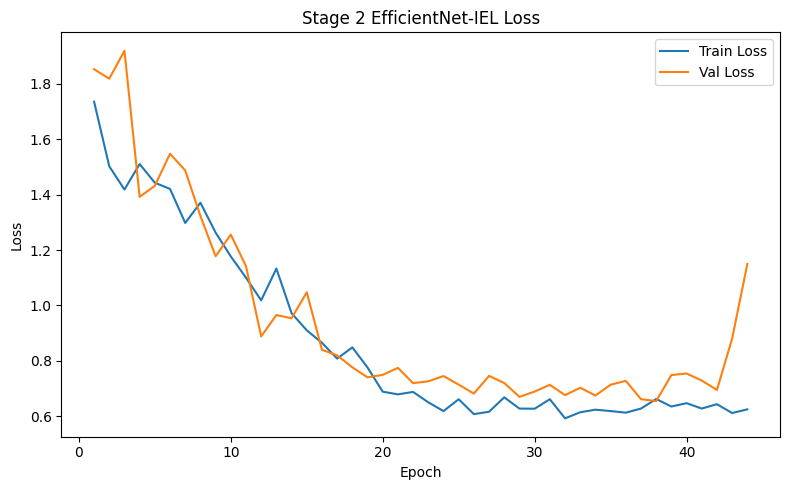

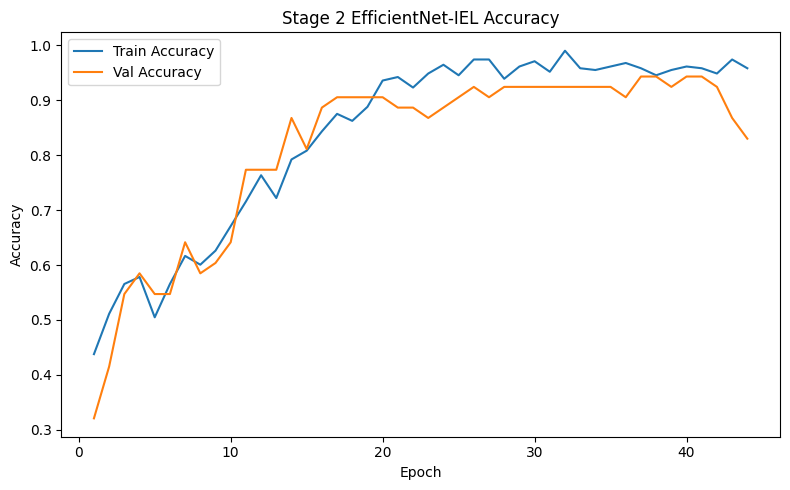

In [31]:
# RESUME STAGE 2: Load best checkpoint and continue training
RESUME_EP = 15

resume_ckpt = torch.load(
    os.path.join(CHECKPOINT_DIR, "stage2_best_checkpoint.pt"), map_location=DEVICE
)
model.load_state_dict(resume_ckpt["model_state_dict"])
best_val_loss  = resume_ckpt["best_val_loss"]
stage2_history = resume_ckpt["history"]
print(f"Resumed from epoch {resume_ckpt['epoch']} | best_val_loss={best_val_loss:.4f}")

unfreeze_top_blocks(model, num_blocks=unfreeze_blocks_stage2)

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=lr_stage2, weight_decay=weight_decay_stage2
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=RESUME_EP, eta_min=1e-7
)

# Restore optimizer and scheduler states — preserves momentum and LR
optimizer.load_state_dict(resume_ckpt["optimizer_state_dict"])
scheduler.load_state_dict(resume_ckpt["scheduler_state_dict"])

early_stop = EarlyStopping(patience=ES_PATIENCE)

for epoch in range(1, RESUME_EP + 1):
    train_loss, train_acc = train_one_epoch(model, train_loader_s2, optimizer, criterion)
    val_loss,   val_acc   = evaluate(model, val_loader, criterion)
    scheduler.step()

    for k, v in zip(["train_loss","train_acc","val_loss","val_acc"],
                    [train_loss, train_acc, val_loss, val_acc]):
        stage2_history[k].append(v)

    print(f"[Resume | Epoch {epoch}/{RESUME_EP}] "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "stage":                "stage2_best",
            "epoch":                resume_ckpt["epoch"] + epoch,
            "model_state_dict":     model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "best_val_loss":        best_val_loss,
            "class_names":          class_names,
            "history":              stage2_history
        }, os.path.join(CHECKPOINT_DIR, "stage2_best_checkpoint.pt"))
        print(f"Saved new best checkpoint: val_loss={val_loss:.4f}")

    early_stop.step(val_loss)
    if early_stop.stop:
        print(f"Early stopping at epoch {epoch}.")
        break

torch.save({
    "stage":                "stage2_resumed_final",
    "epoch":                resume_ckpt["epoch"] + epoch,
    "model_state_dict":     model.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "scheduler_state_dict": scheduler.state_dict(),
    "best_val_loss":        best_val_loss,
    "class_names":          class_names,
    "history":              stage2_history
}, os.path.join(CHECKPOINT_DIR, "stage2_resumed_final_checkpoint.pt"))
print("Saved resumed final checkpoint.")
plot_history(stage2_history, "Stage 2 EfficientNet-IEL", "stage2_full")

From the graph, bad point is there are a lot of fluctuations. After epoch 40, the validation loss curve starts to increase. Additional training after epoch 40 definitely makes the training worse.

Good point is the model still did learn a bit, and reached a new validation loss point at 0.6545

### 2.3 EfficientNet Evaluation

In [32]:
# Test evaluation
print("=" * 60)
print("FINAL TEST EVALUATION")
print("=" * 60)

best_s2 = torch.load(
    os.path.join(CHECKPOINT_DIR, "stage2_best_checkpoint.pt"), map_location=DEVICE
)
model.load_state_dict(best_s2["model_state_dict"])
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f"Final Test Loss:          {test_loss:.4f}")
print(f"Final Test Accuracy:      {test_acc:.4f}")
print(f"Best Validation Loss: {best_s2['best_val_loss']:.4f}")

FINAL TEST EVALUATION
Final Test Loss:          0.7504
Final Test Accuracy:      0.9236
Best Validation Loss: 0.6545


In [33]:
# CLASSIFICATION REPORT
model.eval()
all_preds, all_labels = [], []
with torch.no_grad():
    for imgs, targets in test_loader:
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        final_logits, _ = model(imgs)
        all_preds.extend(final_logits.argmax(dim=1).cpu().numpy())
        all_labels.extend(targets.cpu().numpy())

report = classification_report(all_labels, all_preds, target_names=class_names, digits=4)
print("=" * 60); print("CLASSIFICATION REPORT"); print("=" * 60)
print(report)

with open(os.path.join(CHECKPOINT_DIR, "classification_report.txt"), "w") as f:
    f.write(report)

report_df = pd.DataFrame(
    classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)
).transpose()
report_df.to_csv(os.path.join(CHECKPOINT_DIR, "classification_report.csv"))
display(report_df)

CLASSIFICATION REPORT
                   precision    recall  f1-score   support

   apple_ambrosia     1.0000    0.8947    0.9444        19
apple_grannysmith     1.0000    1.0000    1.0000        19
       apple_jazz     0.9500    0.9500    0.9500        20
      apple_kanzi     0.8947    0.8947    0.8947        19
         apple_mi     0.8621    0.8929    0.8772        28
   apple_pinklady     0.9524    0.8696    0.9091        23
  apple_royalgala     0.8750    0.9655    0.9180        29

         accuracy                         0.9236       157
        macro avg     0.9335    0.9239    0.9276       157
     weighted avg     0.9262    0.9236    0.9238       157



,precision,recall,f1-score,support
apple_ambrosia,1.000000,0.894737,0.944444,19.000000
apple_grannysmith,1.000000,1.000000,1.000000,19.000000
apple_jazz,0.950000,0.950000,0.950000,20.000000
apple_kanzi,0.894737,0.894737,0.894737,19.000000
apple_mi,0.862069,0.892857,0.877193,28.000000
apple_pinklady,0.952381,0.869565,0.909091,23.000000
apple_royalgala,0.875000,0.965517,0.918033,29.000000
accuracy,0.923567,0.923567,0.923567,0.923567
macro avg,0.933455,0.923916,0.927643,157.000000
weighted avg,0.926227,0.923567,0.923808,157.000000


The model achieved an overall test accuracy of 92.36% across 157 test samples spanning 7 apple varieties, with a macro average F1-score of 0.9276 and weighted average F1-score of 0.9238, indicating strong and consistent performance across all classes despite moderate class size imbalance.

**Per-Class Performance**

Granny Smith achieved perfect classification with precision, recall, and F1-score all at 1.000, reflecting its visually distinct green colouration that clearly separates it from all other varieties. Ambrosia reached perfect precision at 1.000 with an F1-score of 0.944, a notable improvement given its previously challenging overlap with other yellowish-red varieties. Jazz and Kanzi achieved F1-scores of 0.950 and 0.895 respectively, demonstrating strong performance across the visually similar red and bicolour group. Royal Gala and Pink Lady achieved F1-scores of 0.918 and 0.909, while apple_mi achieved 0.877, remaining the most challenging class.

**Strengths**

The model generalises well across all seven varieties with no class falling below F1=0.877. The close alignment between macro average (0.9276) and weighted average (0.9238) F1-scores indicates performance is consistent regardless of class size, with no single large class dominating the metric. Ambrosia achieving perfect precision is a particularly strong result given its visual similarity to Kanzi and Royal Gala.

**Limitations**

Apple_mi shows the lowest F1-score at 0.877, with recall at 0.893 being its weaker dimension. This is likely due to apple_mi appearing in varied contexts — held in hands, placed on surfaces, or grouped with other apples — making it harder for the model to consistently identify variety-specific features. More training samples with consistent backgrounds may help improve recognition.

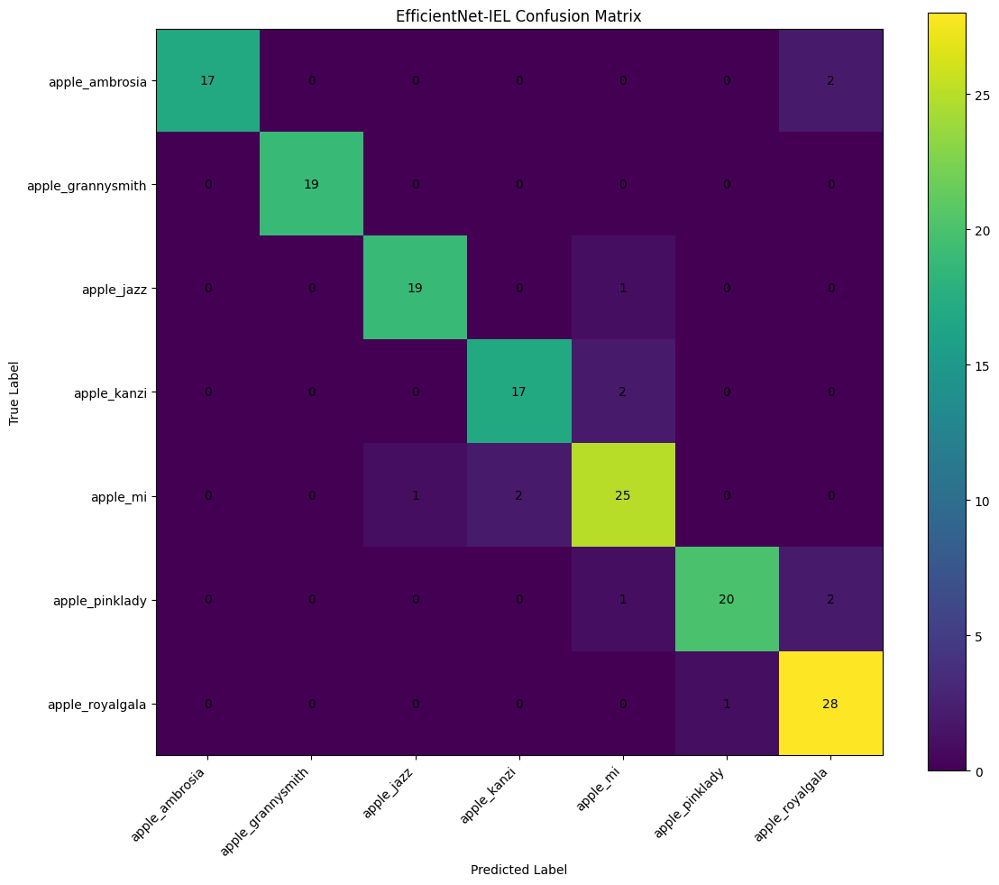

In [34]:
# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(12, 10))
plt.imshow(cm)
plt.title("EfficientNet-IEL Confusion Matrix")
plt.xlabel("Predicted Label"); plt.ylabel("True Label")
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45, ha="right")
plt.yticks(tick_marks, class_names)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, str(cm[i, j]), ha="center", va="center")
plt.tight_layout()
plt.savefig(os.path.join(CHECKPOINT_DIR, "confusion_matrix.png"), dpi=300)
plt.show()

The diagonal dominance across all seven classes confirms strong overall classification performance. Granny Smith achieves perfect separation with 19/19 correct, and Royal Gala correctly classifies 28 out of 29 samples — the highest absolute count in the matrix. Jazz and Ambrosia correctly classify 19/20 and 17/19 respectively, both improving from previous runs.

**Primary Confusion Patterns**

The most notable confusion remains between apple_mi and apple_kanzi, where 2 mi samples are predicted as kanzi and 2 kanzi samples are predicted as mi. This bidirectional confusion persists across runs and reflects the overlapping red-orange blush colouration shared between these two varieties.

Ambrosia shows 2 misclassifications to royalgala, suggesting the model still occasionally conflates the yellowish-red surface of ambrosia with the deeper red of royalgala under certain lighting conditions.

Pink Lady shows misclassifications to both mi and royalgala (1 each) consistent with its visual overlap with other red varieties. Apple_mi also shows 1 misclassification to jazz.

**Summary**

The primary confusion cluster remains among the red and bicolour varieties (mi, kanzi, ambrosia, pinklady, and royalgala) which share overlapping colour profiles. Granny Smith remains perfectly isolated with zero errors in any direction.

In this version, the error counts are slightly reduced and more evenly distributed, indicating the model has continued to learn more robust variety-level features. No single misclassification pair dominates, which suggests the remaining errors reflect genuine visual ambiguity in the dataset rather than systematic model failure.

## 3. ResNet50

In [35]:
CHECKPOINT_DIR = os.path.join(PROJECT_DIR, "checkpoints_resnet50_iel")
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

IMG_SIZE           = 224
MODEL_NAME         = "resnet50"
LR_HEAD            = 2e-4
LR_FINETUNE        = 5e-5
WEIGHT_DECAY_S1    = 5e-4
WEIGHT_DECAY_S2    = 1e-3
DROP_RATE          = 0.4
UNFREEZE_BLOCKS_S1 = 3
UNFREEZE_BLOCKS_S2 = 4
TAP_LAYERS         = ["layer2", "layer3"]
FUSION_DIM         = 512

# 60% TRAIN, 10% VAL, 30% TEST
base_dataset = datasets.ImageFolder(root=data_dir, transform=None)
class_names  = base_dataset.classes
num_classes  = len(class_names)
labels       = np.array([label for _, label in base_dataset.samples])
indices      = np.arange(len(base_dataset))

trainval_idx, test_idx = train_test_split(
    indices, test_size=0.30, stratify=labels, random_state=SEED
)
train_idx, val_idx = train_test_split(
    trainval_idx, test_size=10/70, stratify=labels[trainval_idx], random_state=SEED
)

# TRANSFORMS
train_plain_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])
val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

# DATA LOADERS
train_loader_s1 = DataLoader(
    PlainSubset(base_dataset, train_idx, train_plain_transform),
    batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
val_loader = DataLoader(
    PlainSubset(base_dataset, val_idx, val_transform),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    PlainSubset(base_dataset, test_idx, val_transform),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
criterion = LabelSmoothingCE(eps=LABEL_EPS, num_classes=num_classes)

# ResNet50-IEL MODEL
class ResNetIEL(nn.Module):
    def __init__(self, num_classes, tap_layers=TAP_LAYERS,
                 fusion_dim=FUSION_DIM, drop_rate=DROP_RATE):
        super().__init__()
        backbone    = timm.create_model("resnet50", pretrained=True,
                                        num_classes=0, global_pool='')
        self.layer0 = nn.Sequential(backbone.conv1, backbone.bn1,
                                    backbone.act1, backbone.maxpool)
        self.layer1 = backbone.layer1
        self.layer2 = backbone.layer2
        self.layer3 = backbone.layer3
        self.layer4 = backbone.layer4
        self.tap_layers  = tap_layers
        self.fusion_dim  = fusion_dim
        self.num_classes = num_classes
        channel_dims = self._detect_channel_dims()
        self.projectors = nn.ModuleList([
            nn.Sequential(
                nn.AdaptiveAvgPool2d(1), nn.Flatten(),
                nn.Linear(c, fusion_dim), nn.LayerNorm(fusion_dim),
                nn.GELU(), nn.Dropout(drop_rate)
            ) for c in channel_dims
        ])
        self.cross_layer_attn = nn.MultiheadAttention(
            embed_dim=fusion_dim, num_heads=8,
            dropout=drop_rate, batch_first=True
        )
        self.ln1 = nn.LayerNorm(fusion_dim)
        self.ln2 = nn.LayerNorm(fusion_dim)
        self.ffn = nn.Sequential(
            nn.Linear(fusion_dim, fusion_dim * 2), nn.GELU(),
            nn.Dropout(drop_rate),
            nn.Linear(fusion_dim * 2, fusion_dim), nn.Dropout(drop_rate)
        )
        self.prior_head = nn.Sequential(
            nn.Dropout(drop_rate), nn.Linear(fusion_dim, num_classes)
        )
        self.final_head = nn.Sequential(
            nn.Dropout(drop_rate), nn.Linear(fusion_dim, num_classes)
        )

    def _detect_channel_dims(self):
        dims = []
        with torch.no_grad():
            x = self.layer0(torch.zeros(1, 3, IMG_SIZE, IMG_SIZE))
            x = self.layer1(x)
            for name in self.tap_layers:
                x = getattr(self, name)(x)
                dims.append(x.shape[1])
        return dims

    def _forward_features(self, x):
        x = self.layer0(x)
        x = self.layer1(x)
        feats = []
        for name in self.tap_layers:
            x = getattr(self, name)(x)
            feats.append(x)
        return feats

    def forward(self, x):
        layer_feats      = self._forward_features(x)
        projected        = [proj(f) for proj, f in zip(self.projectors, layer_feats)]
        seq              = torch.stack(projected, dim=1)
        prior_logits     = self.prior_head(seq.mean(dim=1))
        attn_out, _      = self.cross_layer_attn(seq, seq, seq)
        seq              = self.ln1(seq + attn_out)
        seq              = self.ln2(seq + self.ffn(seq))
        final_logits     = self.final_head(seq.mean(dim=1)) + LAMBDA_ASSIST * prior_logits
        return final_logits, prior_logits

# FREEZE / UNFREEZE
def freeze_backbone(model):
    for name in ["layer0", "layer1", "layer2", "layer3", "layer4"]:
        for p in getattr(model, name).parameters():
            p.requires_grad = False
    for m in [model.projectors, model.cross_layer_attn,
              model.ln1, model.ln2, model.ffn,
              model.prior_head, model.final_head]:
        for p in m.parameters():
            p.requires_grad = True
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Frozen backbone. Trainable: {t:,} / {sum(p.numel() for p in model.parameters()):,}")

def unfreeze_top_blocks(model, num_blocks):
    for name in ["layer4", "layer3", "layer2", "layer1", "layer0"][:num_blocks]:
        for p in getattr(model, name).parameters():
            p.requires_grad = True
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Unfroze top {num_blocks} blocks. Trainable: {t:,} / {sum(p.numel() for p in model.parameters()):,}")

def build_model(num_classes):
    return ResNetIEL(num_classes).to(DEVICE)

def get_gradcam_layers(model):
    return [getattr(model, name) for name in model.tap_layers]


Device: cuda
Classes: ['apple_ambrosia', 'apple_grannysmith', 'apple_jazz', 'apple_kanzi', 'apple_mi', 'apple_pinklady', 'apple_royalgala']
Train: 313 | Val: 53 | Test: 157


### 3.1 Stage 1 Training


STAGE 1


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Frozen backbone. Trainable: 2,899,470 / 26,407,502
Unfroze top 3 blocks. Trainable: 26,182,158 / 26,407,502
[Stage 1 | Epoch 1/30] Train Loss: 2.0688 | Train Acc: 0.1821 | Val Loss: 1.9349 | Val Acc: 0.2453
Saved Stage 1 best checkpoint: val_loss=1.9349
[Stage 1 | Epoch 2/30] Train Loss: 2.0016 | Train Acc: 0.1853 | Val Loss: 2.0366 | Val Acc: 0.1321
EarlyStopping counter: 1/7
[Stage 1 | Epoch 3/30] Train Loss: 1.9484 | Train Acc: 0.1565 | Val Loss: 1.8781 | Val Acc: 0.2453
Saved Stage 1 best checkpoint: val_loss=1.8781
[Stage 1 | Epoch 4/30] Train Loss: 1.9241 | Train Acc: 0.2141 | Val Loss: 1.8962 | Val Acc: 0.2453
EarlyStopping counter: 1/7
[Stage 1 | Epoch 5/30] Train Loss: 1.8899 | Train Acc: 0.2907 | Val Loss: 1.8652 | Val Acc: 0.3208
Saved Stage 1 best checkpoint: val_loss=1.8652
[Stage 1 | Epoch 6/30] Train Loss: 1.8507 | Train Acc: 0.3131 | Val Loss: 1.6894 | Val Acc: 0.3962
Saved Stage 1 best checkpoint: val_loss=1.6894
[Stage 1 | Epoch 7/30] Train Loss: 1.7411 | Train Acc: 0

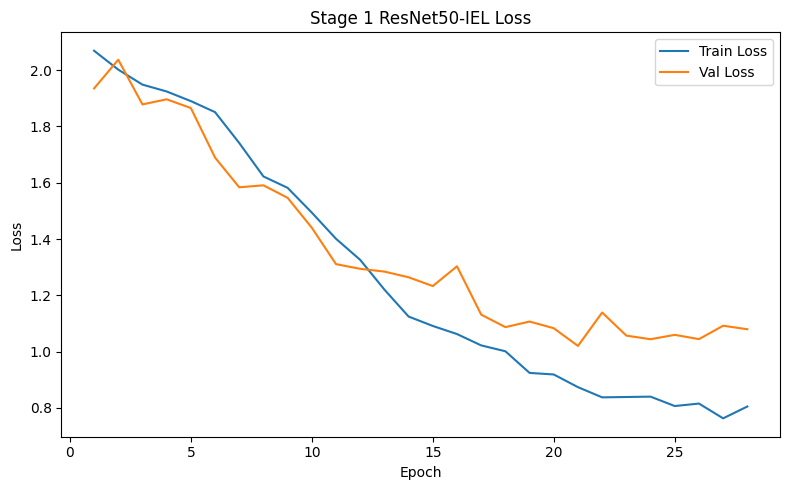

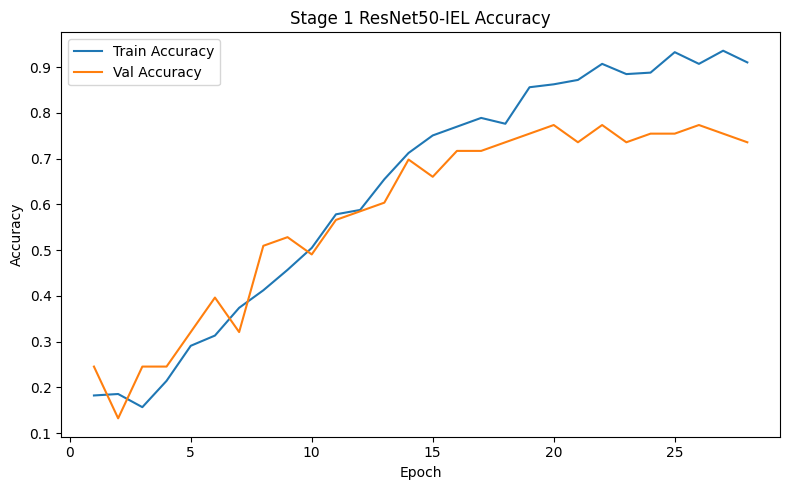

In [36]:
# STAGE 1:
print("STAGE 1")
print("=" * 60)
model = build_model(num_classes)
freeze_backbone(model)
unfreeze_top_blocks(model, num_blocks=UNFREEZE_BLOCKS_S1)

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR_HEAD, weight_decay=WEIGHT_DECAY_S1
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=STAGE1_EP, eta_min=1e-6
)
early_stop     = EarlyStopping(patience=ES_PATIENCE)
best_val_loss  = float('inf')
stage1_history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

for epoch in range(1, STAGE1_EP + 1):
    train_loss, train_acc = train_one_epoch(model, train_loader_s1, optimizer, criterion)
    val_loss,   val_acc   = evaluate(model, val_loader, criterion)
    scheduler.step()

    for k, v in zip(["train_loss","train_acc","val_loss","val_acc"],
                    [train_loss, train_acc, val_loss, val_acc]):
        stage1_history[k].append(v)

    print(f"[Stage 1 | Epoch {epoch}/{STAGE1_EP}] "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "stage":            "stage1_best",
            "epoch":            epoch,
            "model_state_dict": model.state_dict(),
            "best_val_loss":    best_val_loss,
            "class_names":      class_names,
            "history":          stage1_history
        }, os.path.join(CHECKPOINT_DIR, "stage1_best_checkpoint.pt"))
        print(f"Saved Stage 1 best checkpoint: val_loss={val_loss:.4f}")

    early_stop.step(val_loss)
    if early_stop.stop:
        print(f"Early stopping Stage 1 at epoch {epoch}.")
        break

torch.save({
    "stage":            "stage1_final",
    "epoch":            epoch,
    "model_state_dict": model.state_dict(),
    "best_val_loss":    best_val_loss,
    "class_names":      class_names,
    "history":          stage1_history
}, os.path.join(CHECKPOINT_DIR, "stage1_final_checkpoint.pt"))
print("Saved Stage 1 final checkpoint.")
plot_history(stage1_history, "Stage 1 ResNet50-IEL", "stage1")

Both train and val loss start high around 2.0 and come down together steadily across all 29 epochs. The curves move in parallel for the first 10 epochs which is a healthy sign — the model is learning without overfitting early on. After epoch 10 a small gap opens as train loss continues dropping to around 0.80 while val loss levels off around 1.05. The convergence is smooth with no sharp spikes or sudden jumps.

Compared to EfficientNet Stage 1, ResNet50 is slower to learn. EfficientNet drops much faster in the first 5 epochs and reaches a lower val loss of around 0.80 by the end. ResNet50 only gets to around 1.05. This means EfficientNet's pretrained features are better suited for apple classification out of the box, so it needs less training to get good heatmaps for Stage 2.

Building multi-layer Grad-CAM heatmap cache (IEL-MLV)...


sys:1: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.


  50/313 | valid=44 | skipped=6
  100/313 | valid=89 | skipped=11
  150/313 | valid=135 | skipped=15
  200/313 | valid=181 | skipped=19
  250/313 | valid=226 | skipped=24
  300/313 | valid=267 | skipped=33
Visualising random training examples...


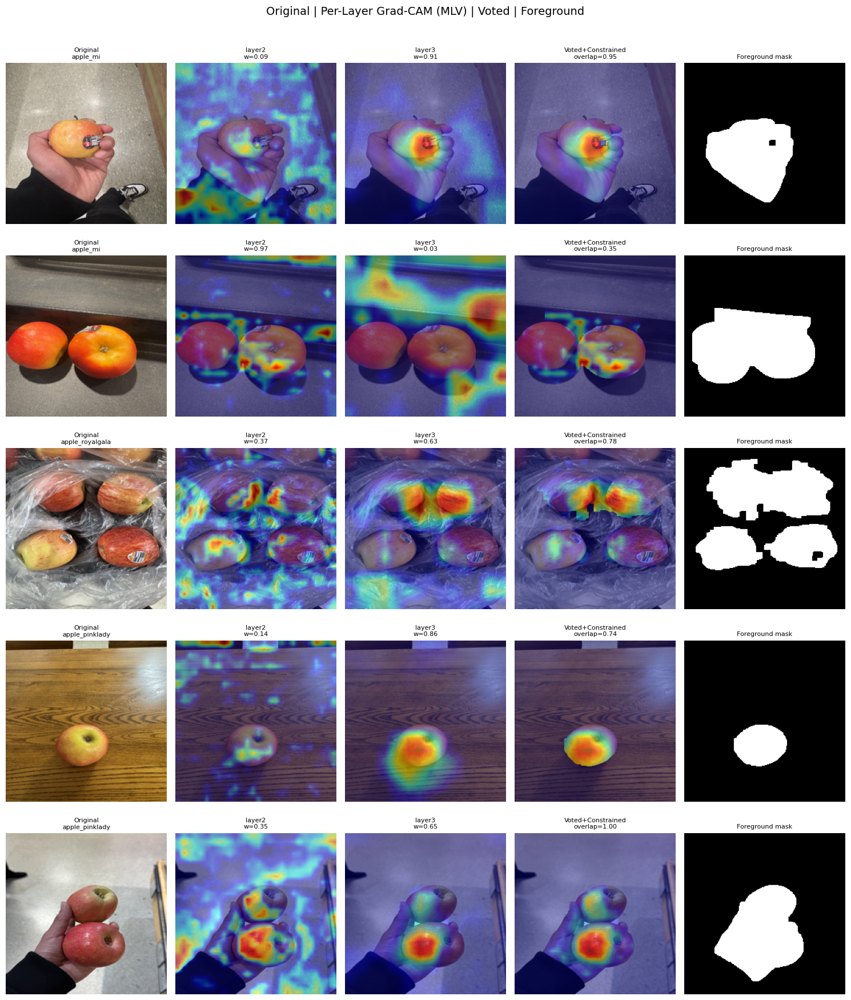

Visualising skipped background-focused examples...


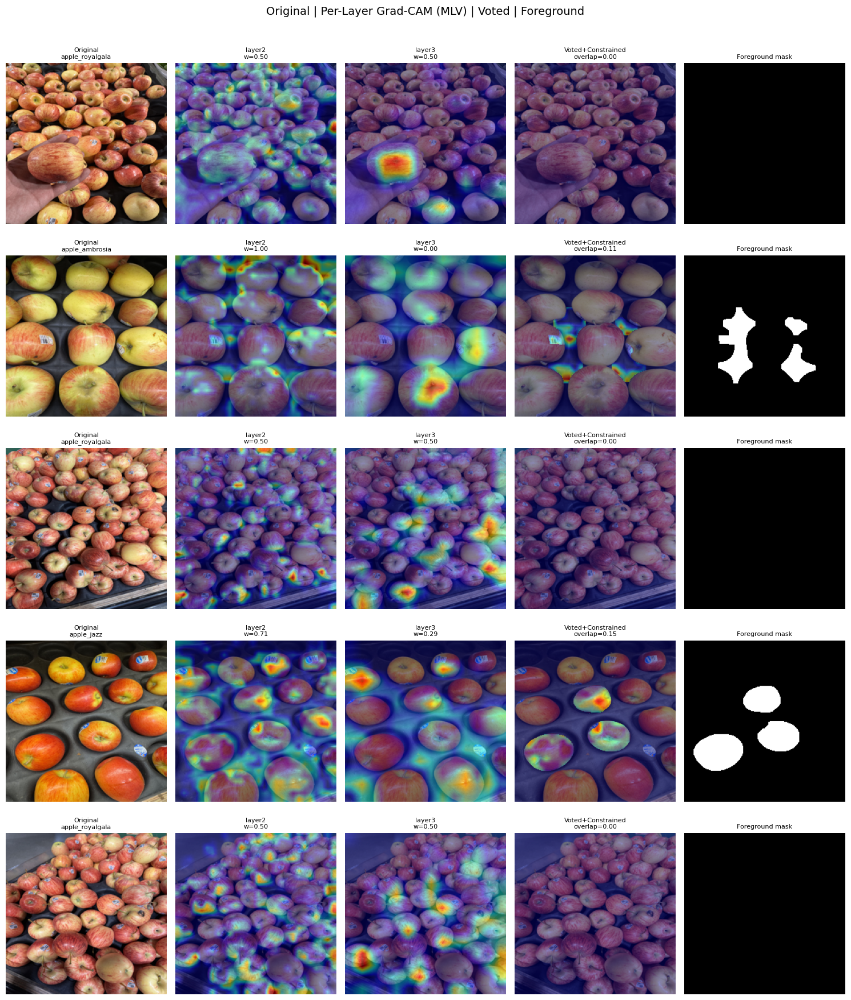

In [37]:
# GENERATE MULTI-LAYER GRAD-CAM HEATMAPS
stage1_ckpt = torch.load(
    os.path.join(CHECKPOINT_DIR, "stage1_best_checkpoint.pt"), map_location=DEVICE
)
model.load_state_dict(stage1_ckpt["model_state_dict"])
heatmap_cache = build_gradcam_cache(model, base_dataset, train_idx)
torch.save(heatmap_cache, os.path.join(CHECKPOINT_DIR, "iel_gradcam_cache.pt"))

# VISUALISE GRAD-CAM SAMPLES
print("Visualising random training examples...")
sample_indices = random.sample(list(train_idx), min(5, len(train_idx)))
visualize_gradcam_samples(base_dataset, heatmap_cache, sample_indices,
                          "iel_gradcam_samples.png")

bad_indices = [idx for idx in train_idx if not heatmap_cache[idx]["valid"]]
if len(bad_indices) > 0:
    print("Visualising skipped background-focused examples...")
    visualize_gradcam_samples(base_dataset, heatmap_cache,
                              random.sample(bad_indices, min(5, len(bad_indices))),
                              "iel_gradcam_skipped_samples.png")

### 3.2 Stage 2 Training

STAGE 2
Unfroze top 4 blocks. Trainable: 26,397,966 / 26,407,502
[Stage 2 | Epoch 1/30] Train Loss: 1.2327 | Train Acc: 0.6933 | Val Loss: 1.1668 | Val Acc: 0.7170
Saved Stage 2 best checkpoint: val_loss=1.1668
[Stage 2 | Epoch 2/30] Train Loss: 1.0763 | Train Acc: 0.7668 | Val Loss: 1.0321 | Val Acc: 0.7925
Saved Stage 2 best checkpoint: val_loss=1.0321
[Stage 2 | Epoch 3/30] Train Loss: 1.0391 | Train Acc: 0.8115 | Val Loss: 1.0146 | Val Acc: 0.8113
Saved Stage 2 best checkpoint: val_loss=1.0146
[Stage 2 | Epoch 4/30] Train Loss: 1.0648 | Train Acc: 0.7796 | Val Loss: 1.0365 | Val Acc: 0.8113
EarlyStopping counter: 1/7
[Stage 2 | Epoch 5/30] Train Loss: 1.0280 | Train Acc: 0.7668 | Val Loss: 1.0189 | Val Acc: 0.8113
EarlyStopping counter: 2/7
[Stage 2 | Epoch 6/30] Train Loss: 1.0651 | Train Acc: 0.7700 | Val Loss: 1.0176 | Val Acc: 0.8491
EarlyStopping counter: 3/7
[Stage 2 | Epoch 7/30] Train Loss: 1.0567 | Train Acc: 0.7955 | Val Loss: 1.0040 | Val Acc: 0.8113
Saved Stage 2 best c

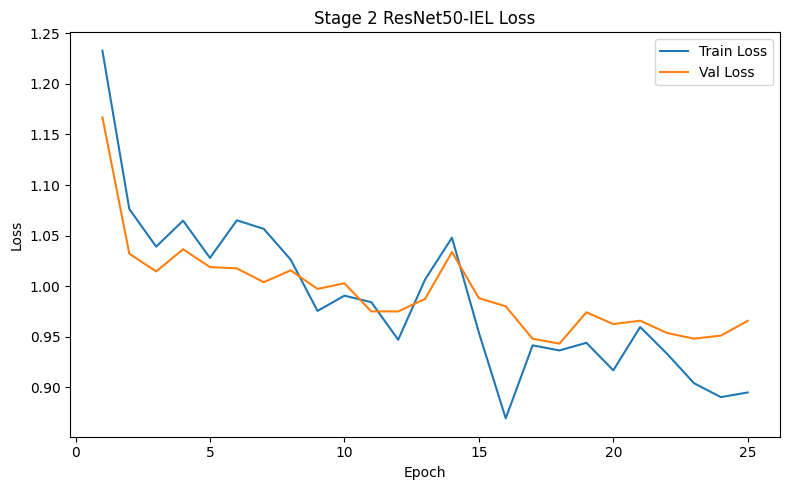

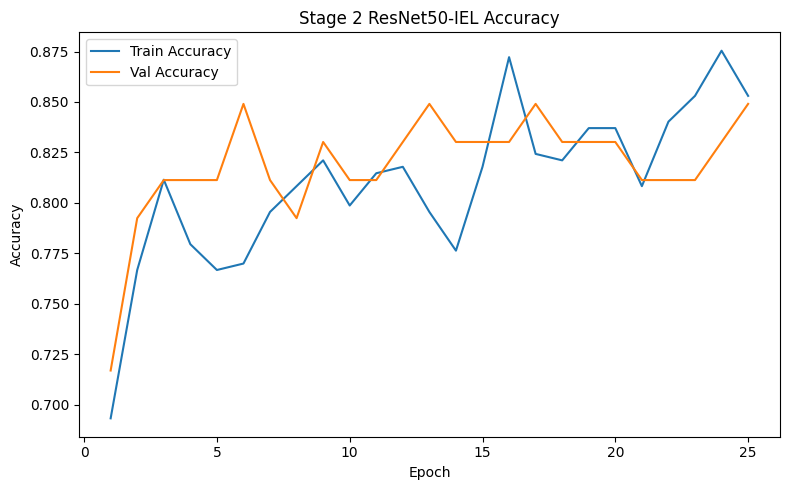

In [38]:
# STAGE 2:
print("STAGE 2")
print("=" * 60)
unfreeze_top_blocks(model, num_blocks=UNFREEZE_BLOCKS_S2)

train_loader_s2 = DataLoader(
    GradCAMAugDataset(base_dataset, train_idx, heatmap_cache, train_plain_transform),
    batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR_FINETUNE, weight_decay=WEIGHT_DECAY_S2
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=STAGE2_EP, eta_min=1e-7
)
early_stop     = EarlyStopping(patience=ES_PATIENCE)
best_val_loss  = float('inf')
stage2_history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

for epoch in range(1, STAGE2_EP + 1):
    train_loss, train_acc = train_one_epoch(model, train_loader_s2, optimizer, criterion)
    val_loss,   val_acc   = evaluate(model, val_loader, criterion)
    scheduler.step()

    for k, v in zip(["train_loss","train_acc","val_loss","val_acc"],
                    [train_loss, train_acc, val_loss, val_acc]):
        stage2_history[k].append(v)

    print(f"[Stage 2 | Epoch {epoch}/{STAGE2_EP}] "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            "stage":            "stage2_best",
            "epoch":            epoch,
            "model_state_dict": model.state_dict(),
            "best_val_loss":    best_val_loss,
            "class_names":      class_names,
            "history":          stage2_history
        }, os.path.join(CHECKPOINT_DIR, "stage2_best_checkpoint.pt"))
        print(f"Saved Stage 2 best checkpoint: val_loss={val_loss:.4f}")

    early_stop.step(val_loss)
    if early_stop.stop:
        print(f"Early stopping Stage 2 at epoch {epoch}.")
        break

torch.save({
    "stage":            "stage2_final",
    "epoch":            epoch,
    "model_state_dict": model.state_dict(),
    "best_val_loss":    best_val_loss,
    "class_names":      class_names,
    "history":          stage2_history
}, os.path.join(CHECKPOINT_DIR, "stage2_final_checkpoint.pt"))
print("Saved Stage 2 final checkpoint.")
plot_history(stage2_history, "Stage 2 ResNet50-IEL", "stage2")


In Stage 2, the training although is not stable but both validation and training loss curves show sign of learning.

The training process is not overfitted, however, compared to EfficientNet, the ResNet50 training is not as efficient as EfficientNet model.

### 3.3 ResNet50 Evaluation

In [39]:
# FINAL TEST EVALUATION
print("=" * 60)
print("FINAL TEST EVALUATION")
print("=" * 60)
best_s2 = torch.load(
    os.path.join(CHECKPOINT_DIR, "stage2_best_checkpoint.pt"), map_location=DEVICE
)
model.load_state_dict(best_s2["model_state_dict"])
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f"Final Test Loss:       {test_loss:.4f}")
print(f"Final Test Accuracy:   {test_acc:.4f}")
print(f"Best Validation Loss:  {best_s2['best_val_loss']:.4f}")

FINAL TEST EVALUATION
Final Test Loss:       0.9592
Final Test Accuracy:   0.8344
Best Validation Loss:  0.9433


In [40]:
# CLASSIFICATION REPORT
model.eval()
all_preds, all_labels = [], []
with torch.no_grad():
    for imgs, targets in test_loader:
        imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
        final_logits, _ = model(imgs)
        all_preds.extend(final_logits.argmax(dim=1).cpu().numpy())
        all_labels.extend(targets.cpu().numpy())

report = classification_report(all_labels, all_preds, target_names=class_names, digits=4)
print("=" * 60); print("CLASSIFICATION REPORT"); print("=" * 60)
print(report)

CLASSIFICATION REPORT
                   precision    recall  f1-score   support

   apple_ambrosia     0.7647    0.6842    0.7222        19
apple_grannysmith     1.0000    1.0000    1.0000        19
       apple_jazz     0.6538    0.8500    0.7391        20
      apple_kanzi     0.8235    0.7368    0.7778        19
         apple_mi     0.8889    0.8571    0.8727        28
   apple_pinklady     0.8333    0.8696    0.8511        23
  apple_royalgala     0.8889    0.8276    0.8571        29

         accuracy                         0.8344       157
        macro avg     0.8362    0.8322    0.8314       157
     weighted avg     0.8413    0.8344    0.8354       157



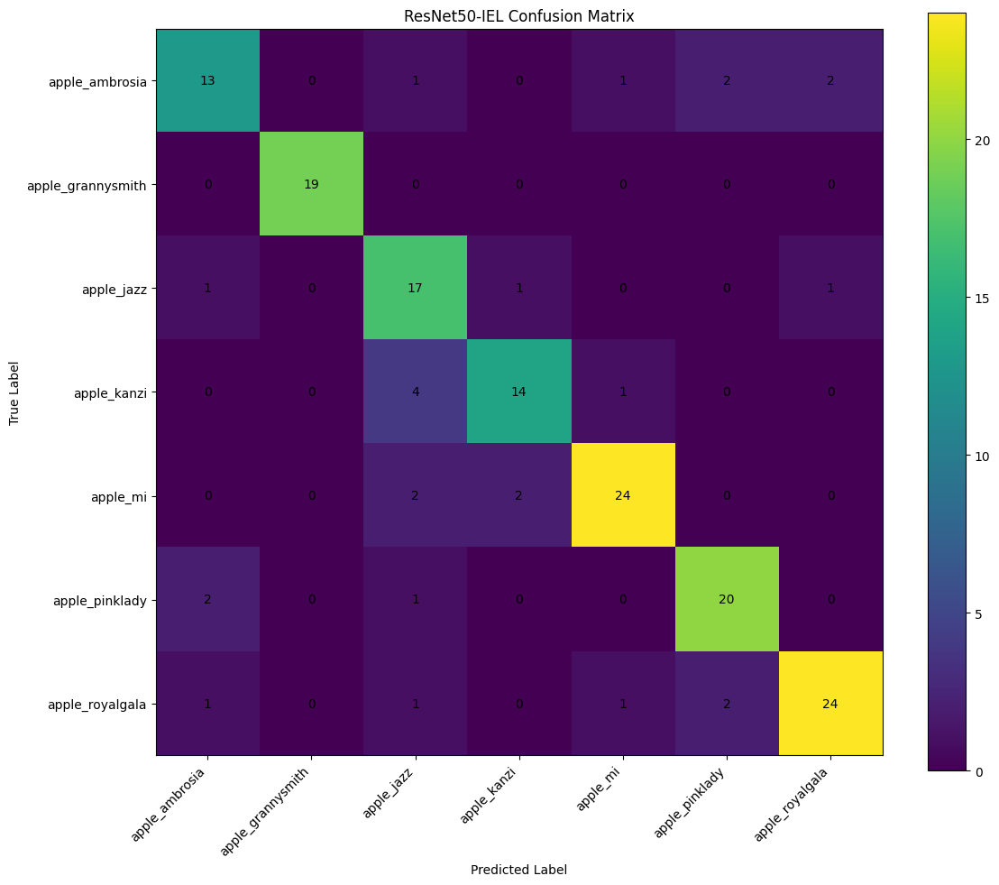

In [41]:
# ============================================================
# 21. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(12, 10))
plt.imshow(cm)
plt.title("ResNet50-IEL Confusion Matrix")
plt.xlabel("Predicted Label"); plt.ylabel("True Label")
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45, ha="right")
plt.yticks(tick_marks, class_names)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, str(cm[i, j]), ha="center", va="center")
plt.tight_layout()
plt.savefig(os.path.join(CHECKPOINT_DIR, "confusion_matrix.png"), dpi=300)
plt.show()

## 4. EfficientNet vs ResNet50 Training Result Comparison

|  |EfficientNet  | ResNet50  |
|--|--|--|
|Accuracy |0.9236   |  0.8344|
|Best validation loss | 0.6545 | 0.9433 |

Overall, both models trainings are good, no sign of overfitting (despite slight overfitting in stage 1).

EfficientNet has a better accuracy than ResNet50, and its training is less fluctuated than ResNet50.

**Precision**

---

| Class | EfficientNet | ResNet50 |
|---|---|---|
| apple_ambrosia | 1.0000 | 0.7647 |
| apple_grannysmith | 1.0000 | 1.0000 |
| apple_jazz | 0.9500 | 0.6538 |
| apple_kanzi | 0.8947 | 0.8235 |
| apple_mi | 0.8621 | 0.8889 |
| apple_pinklady | 0.9524 | 0.8333 |
| apple_royalgala | 0.8750 | 0.8889 |
| **macro avg** | **0.9335** | **0.8362** |
| **weighted avg** | **0.9262** | **0.8413** |

EfficientNet outperforms ResNet50 in precision across most classes. Ambrosia and Granny Smith both achieve perfect precision of 1.000 in EfficientNet, meaning every sample predicted as these varieties was correct with zero false positives. Jazz also achieves strong precision at 0.950 in EfficientNet compared to only 0.654 in ResNet50, the largest gap between the two models, suggesting ResNet50 frequently misclassifies other varieties as Jazz.

The only classes where ResNet50 matches or edges ahead are apple_mi (0.889 vs 0.862) and apple_royalgala (0.889 vs 0.875), both by a small margin. This indicates ResNet50 is slightly more conservative when predicting these two classes, avoiding false positives at the cost of missing more true samples.
At the macro average level EfficientNet (0.934) leads ResNet50 (0.836) by nearly 0.10, which is a substantial gap. This means on average EfficientNet makes far fewer false positive predictions per class. The weighted average tells the same story, 0.926 vs 0.841, confirming the advantage holds when accounting for class size differences.

Overall EfficientNet is the more precise model, particularly for the visually distinct classes like Ambrosia, Granny Smith, and Jazz. ResNet50 struggles most with Jazz precision, suggesting it confuses other red varieties as Jazz more frequently than EfficientNet does.

**Recall**

---

| Class | EfficientNet | ResNet50 |
|---|---|---|
| apple_ambrosia | 0.8947 | 0.6842 |
| apple_grannysmith | 1.0000 | 1.0000 |
| apple_jazz | 0.9500 | 0.8500 |
| apple_kanzi | 0.8947 | 0.7368 |
| apple_mi | 0.8929 | 0.8571 |
| apple_pinklady | 0.8696 | 0.8696 |
| apple_royalgala | 0.9655 | 0.8276 |
| **macro avg** | **0.9239** | **0.8322** |
| **weighted avg** | **0.9236** | **0.8344** |

EfficientNet outperforms ResNet50 in recall across almost every class. Granny Smith is the only class where both models are equal, both achieving perfect recall of 1.000, every single Granny Smith sample is correctly identified by both models. Pink Lady is the only other class where the two models tie at 0.870.

The largest gaps appear in Ambrosia (0.895 vs 0.684) and Kanzi (0.895 vs 0.737), where ResNet50 misses a significantly higher proportion of true samples. For Ambrosia, ResNet50's recall of 0.684 means roughly 1 in 3 Ambrosia apples are missed entirely which is a meaningful failure for a real-world classification scenario. Royal Gala also shows a notable gap with EfficientNet at 0.966 compared to ResNet50 at 0.828.

At the macro average level EfficientNet (0.924) leads ResNet50 (0.832) by approximately 0.09, consistent with the precision gap observed earlier. The weighted average confirms the same pattern, 0.924 vs 0.834, meaning EfficientNet catches more true samples across all classes regardless of class size.

Overall EfficientNet is the stronger model in recall, meaning it misses fewer true apple variety samples. ResNet50's weakness is particularly pronounced in Ambrosia and Kanzi where both visually ambiguous red varieties, suggesting it struggles to find enough discriminative features to reliably identify these classes even when precision is acceptable.

**F1 score**

---

| Class | EfficientNet | ResNet50 |
|---|---|---|
| apple_ambrosia | 0.9444 | 0.7222 |
| apple_grannysmith | 1.0000 | 1.0000 |
| apple_jazz | 0.9500 | 0.7391 |
| apple_kanzi | 0.8947 | 0.7778 |
| apple_mi | 0.8772 | 0.8727 |
| apple_pinklady | 0.9091 | 0.8511 |
| apple_royalgala | 0.9180 | 0.8571 |
| **macro avg** | **0.9276** | **0.8314** |
| **weighted avg** | **0.9238** | **0.8354** |
| **accuracy** | **0.9236** | **0.8344** |

EfficientNet outperforms ResNet50 in F1-score across every class except Granny Smith, where both achieve a perfect 1.000. The F1-score combines precision and recall into a single balanced measure, so the gaps seen here reflect the compounded advantage EfficientNet holds in both metrics.

The largest gap is in Ambrosia (0.944 vs 0.722), a difference of over 0.22, making it the class where EfficientNet most decisively outperforms ResNet50. Jazz shows a similarly large gap at 0.950 vs 0.739, reflecting ResNet50's poor precision on that class observed earlier. Kanzi also shows a meaningful difference at 0.895 vs 0.778.

The only class where the two models are close is apple_mi (0.877 vs 0.873), suggesting both models learn similarly useful features for this variety despite their overall performance gap. This makes sense given apple_mi's larger support of 28 samples as more training examples give both models enough signal to learn the class reasonably well.

At the macro average level EfficientNet (0.928) leads ResNet50 (0.831) by nearly 0.10, and the overall accuracy gap of 0.924 vs 0.834 confirms EfficientNet as the clearly stronger model on this dataset. The consistent advantage across precision, recall, and F1-score across nearly all classes indicates EfficientNet's architecture and the single tap block configuration produced more reliable and discriminative feature representations for fine-grained apple variety classification than ResNet50 with two tap layers.

## 5. Summary

This project aimed to build a fine-grained apple variety classifier capable of distinguishing seven visually similar apple classes using deep learning. The core challenge was that these varieties share overlapping colour profiles, shapes, and surface textures, making standard classification approaches insufficient.

Two architectures were developed and evaluated, both inspired by the Internal Ensemble Learning Transformer (IELT) framework originally proposed for Vision Transformers. The first was EfficientNet-IEL, adapting EfficientNet-B3 as the backbone, and the second was ResNet50-IEL using ResNet50. Both models were trained using a two-stage pipeline — Stage 1 to learn discriminative features and generate Grad-CAM heatmaps, and Stage 2 to fine-tune using targeted augmentations guided by those heatmaps. The augmentation strategy included background suppression and foreground crop-and-enlarge, both constrained to the most discriminative fruit regions identified by multi-layer Grad-CAM voting rather than applied blindly across the whole image.

EfficientNet-IEL achieved a final test accuracy of 92.36% with a macro F1-score of 0.928, outperforming ResNet50-IEL which reached 83.44% accuracy and macro F1 of 0.831. EfficientNet demonstrated superior performance across nearly every class, with particularly strong gains in Ambrosia, Jazz, and Kanzi — the three most visually ambiguous varieties. The only class where both models performed equally was Granny Smith, whose distinct green colouration makes it straightforward to classify regardless of architecture.

EfficientNet outperformed ResNet50 for several reasons. Its depthwise separable convolutional blocks produce richer and more fine-grained intermediate feature representations, which translated to faster convergence in Stage 1 and more reliable Grad-CAM heatmaps for augmentation guidance. The training curves were also more stable. Stage 2 in EfficientNet showed smoother convergence with less oscillation compared to ResNet50. While ResNet50's Dynamic Selection mechanism functioned correctly with meaningful layer weight variation between layer2 and layer3, the overall feature quality from ResNet50's simpler architecture was not sufficient to match EfficientNet's discriminative power on this dataset.

The remaining limitation for both models is performance on densely packed shelf images, where the foreground estimation pipeline fails to isolate individual fruit and produces empty or noisy masks. This is a data-level challenge where images taken in retail display settings with tens of overlapping apples provide insufficient foreground signal for GrabCut and HSV masking to work reliably. Collecting more isolated single-apple images or incorporating instance segmentation as a preprocessing step would likely address this weakness in future work.